# My Spotify Data Analysis - Python


### Table of Contents

* [Introduction](#chapter1)


* [A) Cleaning & Peparation](#chapter2)
    * [Table 1 - My Spotify historical data](#section_2_1)
    * [Table 2 - The audio features of my tracks](#section_2_2)


* [B) Exploratory Data Analysis](#chapter3)
    * [Creating a function for EDA visualisation](#section_3_0)
    * [Table 1 EDA](#section_3_1)
        * [Histograms and boxplots - Distribution of the number of plays by Artists and Tracks](#section_3_1_1)
    * [Table 2 EDA](#section_3_2)
        * [Histograms and boxplots - Part 1 - Defining features and looking for outliers that shouldn't be there](#section_3_2_1)
        * [Correlation matrix of the audio features](#section_3_2_2)
        * [Histograms and Boxplots - Part 2 - Understanding my audio features preferences](#section_3_2_3)


* [C) Analysis Part 1 - Tops](#chapter4)
    * [Top artists](#section_4_1)
    * [Top tracks](#section_4_2)
    * [Top tracks of my top 1 artist](#section_4_3)
    * [Creating a wordcloud visual with my top 100 artists](#section_4_4)
    * [My music consumption on spotify per month during the analysis period (2020-07/2021-07)](#section_4_5)
    * [Which day I listen to spotify the most?](#section_4_6)
    * [Heatmap: When do I listen to Spotify the most during the week (by days and hours)?](#section_4_7)


* [D) Analysis Part 2 - Audio features](#chapter5)
    * [The tracks corresponding to the max and min for each audio feature](#section_5_1)
    * [The audio features corresponding to all the tracks I listened to](#section_5_2)
    * [Audio features: all tracks VS top tracks](#section_5_3)
    * [The audio features corresponding to the tracks I listen to in the morning, afternoon, evening and night/party](#section_5_4)
    * [Using these findings and the audio features patterns, let's find a track I might like to listen to in the morning/afternoon/evening/and during a party at night](#section_5_5)


* [Conclusion](#chapter6)


## Introduction <a class="anchor" id="chapter1"></a>

The main goal of this project is to practice my Python skills in data science and to introduce you to another part of myself which is my music tastes.

In this project, I will analyse my spotify data from July 2020 to July 2021. 

First, I will clean and prepare the data. Then, I will do an exploratory data analysis (EDA) to better understand my data and finish cleaning some weird/wrong outliers. And finally, the analysis. I will separate the analysis into two parts: 

Part 1 - The objectives are :

   - To know which are my top artists and my top tracks.
   - To see my music consumption on spotify per month during the analysis period (2020-07/2021-07).
   - To see when I listen to the most spotify during the week (by day of the week and by hour).

Part 2 - The objectives are:
   
   - Find the tracks corresponding to the max and min for each audio feature.
   - Find the audio features corresponding to all the songs I listened to. 
   - Compare it to the audio features of my top tracks.
   - Analyse the audio features corresponding to the tracks I listen to in the morning, afternoon, evening and night/party.
   - Using these findings and only the audio features, find a track I might like to listen to in the morning/afternoon/evening/and during a party at night.


About the data:

There are two datasets, the first is my historical Spotify data (in JSON format). I got it by requesting it from my Spotify account.
The second is the audio features of the tracks I listened to (in CSV format). I got them using the Spotify API (we will see that sometimes the API couldn't find information for some tracks).

## C) Cleaning & Preparation<a class="anchor" id="chapter2"></a>

### Table 1 - My Spotify historical data: <a class="anchor" id="section_2_1"></a>

In [1]:
#Let's import my spotify historical data into a DataFrame and explore with .head() and .info()
import pandas as pd
spotify_tt = pd.read_json(r'C:\Users\Tristan\Documents\DATA\spotify_project\StreamingHistory0.json', orient = 'records')
spotify_tt.head()

,endTime,artistName,trackName,msPlayed
0,2020-07-16 15:43,Rich Mullins,Hold Me Jesus,8631
1,2020-07-16 15:43,Paolo Conte,L'Orchestrina,198840
2,2020-07-16 15:53,Josh Wilson,"Savior, Please",8540
3,2020-07-17 09:29,Isaac Delusion,fancy,31861
4,2020-07-17 09:30,B77,Fleur,23520


In [2]:
spotify_tt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6859 entries, 0 to 6858
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   endTime     6859 non-null   object
 1   artistName  6859 non-null   object
 2   trackName   6859 non-null   object
 3   msPlayed    6859 non-null   int64 
dtypes: int64(1), object(3)
memory usage: 214.5+ KB


Let's see if we can remove some unnecessary records in our table to reduce the work and time of asking the spotify api about the audio features of each track later.



In [3]:
#Converting msPlayed to min_played and changing the column name
spotify_tt.msPlayed = spotify_tt.msPlayed /  60000
spotify_tt.rename(columns = {'msPlayed':'min_played'}, inplace=True)

#Let's see the first values:
print(spotify_tt.min_played.value_counts().sort_index().head(10))

0.000000    164
0.000017      3
0.000067      1
0.000083      2
0.000100      1
0.000133      3
0.000183      2
0.000200      1
0.000233      1
0.000300      1
Name: min_played, dtype: int64


Text(0, 0.5, 'Nb of tracks')

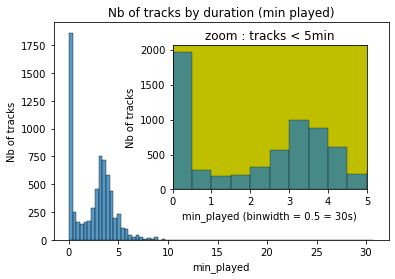

In [4]:
#These results are strange, let's analise all that:
from matplotlib import pyplot as plt
import seaborn as sns
fig, ax = plt.subplots()
sns.histplot(spotify_tt['min_played'], ax=ax)

ax2 = plt.axes([0.4, 0.3, 0.45, 0.5], facecolor='y')
sns.histplot(spotify_tt['min_played'],binwidth=0.5, ax=ax2)
ax2.set_title('zoom : tracks < 5min')
ax2.set_xlabel('min_played (binwidth = 0.5 = 30s)')
ax2.set_ylabel('Nb of tracks')
ax2.set_xlim([0,5])
ax.set_title("Nb of tracks by duration (min played)")
ax.set_ylabel('Nb of tracks')

In [5]:
spotify_tt[spotify_tt['min_played'] < 0.5].count()

endTime       1960
artistName    1960
trackName     1960
min_played    1960
dtype: int64

There are 1960 tracks that were played for less than 30 seconds (0.5 min). 
This is probably when I change tracks directly after the first few seconds. 
We will drop them.

In [6]:
#let's drop those records and validate that with assert and .shape before and after the drop
print(spotify_tt.shape)

spotify_tt = spotify_tt[spotify_tt.min_played >= 0.5]
assert spotify_tt[spotify_tt['min_played'] < 0.5].empty

print(spotify_tt.shape)

(6859, 4)
(4899, 4)


Ok, now let's look at the tracks with more than 8 and 10 minutes played:

In [7]:
print(spotify_tt[spotify_tt['min_played'] > 8].count())
spotify_tt[spotify_tt['min_played'] > 8].head()

endTime       49
artistName    49
trackName     49
min_played    49
dtype: int64


,endTime,artistName,trackName,min_played
39,2020-08-12 07:56,B.B. King,Why I Sing The Blues,8.623333
42,2020-08-12 08:10,The Districts,Young Blood,8.680217
83,2020-08-12 10:48,Peter Cat Recording Co.,Memory Box,8.064000
136,2020-08-13 10:52,Joakim,Nothing Gold - Todd Terje Remix,9.024467
150,2020-08-13 11:41,Donna Summer,"I Feel Love - 12"" Version",8.253100


In [8]:
print(spotify_tt[spotify_tt['min_played'] > 10].count())
spotify_tt[spotify_tt['min_played'] > 10]

endTime       8
artistName    8
trackName     8
min_played    8
dtype: int64


,endTime,artistName,trackName,min_played
164,2020-08-14 15:17,Michael Kiwanuka,Cold Little Heart,10.067467
802,2020-08-25 13:57,Love De-Luxe,Here Comes That Sound Again,11.173433
1796,2020-11-10 15:42,Lil Dicky,Truman,10.240067
4169,2021-04-15 21:24,Le Joboscope,Data scientist,30.725217
4170,2021-04-15 21:54,Le Joboscope,Data analyst,17.910500
6211,2021-07-05 15:10,A suivre,Beatmakers S1 (2/10) : Etienne de Crécy,28.405400
6213,2021-07-05 15:53,A suivre,Beatmakers S1 (8/10) : Synapson,23.405700
6215,2021-07-06 07:46,A suivre,Beatmakers S1 (2/10) : Etienne de Crécy,10.871333


All seems to be normal.
For tracks > 8 minutes: they are tracks that are more than 8 minutes long (I checked on spotify). 
For tracks > 10 minutes: these are often podcasts. Or tracks that are around 8, 9 or 10 minutes long that I played back directly before the true end of the tracks.

In [9]:
#Now, let's rename the columns and reorder the table
spotify_tt.rename(columns = {'endTime':'datetime', 'artistName': 'artist', 'trackName':'track'}, inplace= True)
spotify_tt = spotify_tt[['datetime', 'track', 'artist', 'min_played']]
spotify_tt.head()

,datetime,track,artist,min_played
1,2020-07-16 15:43,L'Orchestrina,Paolo Conte,3.314000
3,2020-07-17 09:29,fancy,Isaac Delusion,0.531017
7,2020-07-17 09:31,Plein de bisous,Lewis OfMan,1.056267
8,2020-07-17 09:32,Le métro et le bus,Lewis OfMan,0.925917
10,2020-07-17 09:36,La légende urbaine,Voyou,3.779767


In [10]:
spotify_tt.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4899 entries, 1 to 6858
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    4899 non-null   object 
 1   track       4899 non-null   object 
 2   artist      4899 non-null   object 
 3   min_played  4899 non-null   float64
dtypes: float64(1), object(3)
memory usage: 191.4+ KB


In [11]:
#We need to convert datetime to a datetime format (we will set that as index later)
spotify_tt.datetime = pd.to_datetime(spotify_tt.datetime)
spotify_tt.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4899 entries, 1 to 6858
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   datetime    4899 non-null   datetime64[ns]
 1   track       4899 non-null   object        
 2   artist      4899 non-null   object        
 3   min_played  4899 non-null   float64       
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 191.4+ KB


In [12]:
#Last check for missing data
spotify_tt.isna().sum()

datetime      0
track         0
artist        0
min_played    0
dtype: int64

In [13]:
#Ok it's clean now, let's save it into a new csv file:
spotify_tt.to_csv(r'C:\Users\Tristan\Documents\DATA\spotify_project\spotify_tt_clean.csv', index=False)

Ok, we cleaned up our historical data table and deleted 1960 unnecessary records to get our audio features with the spotify API. For this, I was helped by Vlad Gheorghe's article.
Article: https://towardsdatascience.com/get-your-spotify-streaming-history-with-python-d5a208bbcbd3

I now have a csv file with my audio features and other information, let's open it:

### Table 2 - The audio features of my tracks: <a class="anchor" id="section_2_2"></a>

In [14]:
#Let's import the csv file and explore it
features = pd.read_csv(r'C:\Users\Tristan\Documents\DATA\spotify_project\features.csv')
features.head()

,Unnamed: 0,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature,albumName,albumID
0,Junk___Étienne de Crécy,0.797,0.579,2.0,-9.340,1.0,0.0497,0.00522,0.871,0.0502,...,124.988,audio_features,0R1l25gRCjthLiYRraCVZW,spotify:track:0R1l25gRCjthLiYRraCVZW,https://api.spotify.com/v1/tracks/0R1l25gRCjth...,https://api.spotify.com/v1/audio-analysis/0R1l...,297293.0,4.0,Commercial EP 3,6a4usN5WtkByPHdcOdCD23
1,The Letter___The Box Tops,0.638,0.428,9.0,-12.156,0.0,0.0687,0.25200,0.000,0.1320,...,139.434,audio_features,6RJK553YhstRzyKA4mug09,spotify:track:6RJK553YhstRzyKA4mug09,https://api.spotify.com/v1/tracks/6RJK553YhstR...,https://api.spotify.com/v1/audio-analysis/6RJK...,112800.0,4.0,The Letter/Neon Rainbow,08mPxuP35Db56jUUgRvGFs
2,Zoom Zoom___Polo & Pan,0.678,0.849,7.0,-6.983,1.0,0.0367,0.04590,0.613,0.0833,...,94.003,audio_features,1gWnuGAiTk3Q4yrIbwymUK,spotify:track:1gWnuGAiTk3Q4yrIbwymUK,https://api.spotify.com/v1/tracks/1gWnuGAiTk3Q...,https://api.spotify.com/v1/audio-analysis/1gWn...,209800.0,4.0,Caravelle,0SuFqlCe5i30Fr75ZlPQVT
3,Californie___Caballero & JeanJass,0.920,0.516,11.0,-8.257,0.0,0.1190,0.38000,0.000,0.0698,...,112.013,audio_features,0sJX7GTLCNowidzM9HfaH5,spotify:track:0sJX7GTLCNowidzM9HfaH5,https://api.spotify.com/v1/tracks/0sJX7GTLCNow...,https://api.spotify.com/v1/audio-analysis/0sJX...,258891.0,4.0,Double hélice 3,6nMcxKyjXxxA0WeIpOpnuJ
4,Una Rosa Blanca___Ibrahim Maalouf,0.463,0.672,8.0,-6.071,0.0,0.0498,0.72800,0.743,0.0993,...,74.916,audio_features,4MOCTiC5mMrJuhLFSNjiIM,spotify:track:4MOCTiC5mMrJuhLFSNjiIM,https://api.spotify.com/v1/tracks/4MOCTiC5mMrJ...,https://api.spotify.com/v1/audio-analysis/4MOC...,338000.0,4.0,S3NS,1XWCws077Z4B9SwwUzOAfo


In [15]:
features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1951 entries, 0 to 1950
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        1951 non-null   object 
 1   danceability      1866 non-null   float64
 2   energy            1866 non-null   float64
 3   key               1866 non-null   float64
 4   loudness          1866 non-null   float64
 5   mode              1866 non-null   float64
 6   speechiness       1866 non-null   float64
 7   acousticness      1866 non-null   float64
 8   instrumentalness  1866 non-null   float64
 9   liveness          1866 non-null   float64
 10  valence           1866 non-null   float64
 11  tempo             1866 non-null   float64
 12  type              1866 non-null   object 
 13  id                1866 non-null   object 
 14  uri               1866 non-null   object 
 15  track_href        1866 non-null   object 
 16  analysis_url      1866 non-null   object 


In [16]:
features.type.value_counts()

audio_features    1866
Name: type, dtype: int64

Ok, we will keep only the audio features that interest us:
danceability, energy, loudness, instrumentalness, acousticness, tempo and mode.

Ps :
- Speechiness is not interesting for music but rather for podcasts. Instrumentalness is the same but for music (1 = no vocals and 0 = lots of vocals).

- Liveness, we don't care if it is live or not, we are only interested in the music itself and its characteristics.

- Type, as we can see above, all my data has the type 'audio_feature' so it is not interesting.

- Id, we can also drop this as we will use 'track' and 'artist' from the first column (which we will split) to merge with my historical data table.

In [17]:
features['track'] = features['Unnamed: 0'].str.split('___').str[0]
features['artist'] = features['Unnamed: 0'].str.split('___').str[1]
features = features[['track', 'artist', 'danceability', 'energy', 'valence', 'loudness','instrumentalness', 'acousticness', 'tempo', 'mode']]
features.head()


,track,artist,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
0,Junk,Étienne de Crécy,0.797,0.579,0.0415,-9.340,0.871,0.00522,124.988,1.0
1,The Letter,The Box Tops,0.638,0.428,0.9010,-12.156,0.000,0.25200,139.434,0.0
2,Zoom Zoom,Polo & Pan,0.678,0.849,0.5020,-6.983,0.613,0.04590,94.003,1.0
3,Californie,Caballero & JeanJass,0.920,0.516,0.5340,-8.257,0.000,0.38000,112.013,0.0
4,Una Rosa Blanca,Ibrahim Maalouf,0.463,0.672,0.5220,-6.071,0.743,0.72800,74.916,0.0


In [18]:
#Let's make sure we don't have duplicated rows
assert features[features.duplicated()].empty


In [19]:
#Let's check missing data
features.isna().sum()

track                0
artist               0
danceability        85
energy              85
valence             85
loudness            85
instrumentalness    85
acousticness        85
tempo               85
mode                85
dtype: int64

In [20]:
features[features.danceability.isna()]

,track,artist,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
22,Vertigo Valley,French 79,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
55,Do It,Camp Claude,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
63,Your Night,Con Funk Shun,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
79,When The Sun Goes Down,Arctic Monkeys,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
84,fancy,Isaac Delusion,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
1860,Harlem Shuffle - Alternate Take,The Foundations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1862,Heaven,The Blaze,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1924,Slim's Night Out,PillowTalk,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1933,Ti voglio,Ornella Vanoni,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Those are the tracks that the API did not find, let's drop them.

In [21]:
#let's drop those records and validate the drop
print(features.shape)
features = features.dropna(subset = ['danceability'])
print(features.isna().sum())
print(features.shape)

(1951, 10)
track               0
artist              0
danceability        0
energy              0
valence             0
loudness            0
instrumentalness    0
acousticness        0
tempo               0
mode                0
dtype: int64
(1866, 10)


In [22]:
#Let's check the data type
features.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1866 entries, 0 to 1950
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track             1866 non-null   object 
 1   artist            1866 non-null   object 
 2   danceability      1866 non-null   float64
 3   energy            1866 non-null   float64
 4   valence           1866 non-null   float64
 5   loudness          1866 non-null   float64
 6   instrumentalness  1866 non-null   float64
 7   acousticness      1866 non-null   float64
 8   tempo             1866 non-null   float64
 9   mode              1866 non-null   float64
dtypes: float64(8), object(2)
memory usage: 160.4+ KB


In [23]:
#Let's convert mode to integer (1= Major mode, 0= Minor mode)
features['mode'] = features['mode'].astype('int')
features.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1866 entries, 0 to 1950
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track             1866 non-null   object 
 1   artist            1866 non-null   object 
 2   danceability      1866 non-null   float64
 3   energy            1866 non-null   float64
 4   valence           1866 non-null   float64
 5   loudness          1866 non-null   float64
 6   instrumentalness  1866 non-null   float64
 7   acousticness      1866 non-null   float64
 8   tempo             1866 non-null   float64
 9   mode              1866 non-null   int32  
dtypes: float64(7), int32(1), object(2)
memory usage: 153.1+ KB


In [24]:
#Ok, now it is clean, let's save it into a new csv file:
features.to_csv(r'C:\Users\Tristan\Documents\DATA\spotify_project\features_clean.csv', index=False)

## B) Exploratory Data Analysis (EDA)<a class="anchor" id="chapter3"></a>

OK, now that our two tables are pretty much clean, let's do some exploratory data analysis that will help us understand our data but also finish cleaning up possible wrong outliers.

### 1 - Creating a function for EDA visualisation: <a class="anchor" id="section_3_0"></a>

In [25]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import numpy as np

#Let's create a function to plot an histgram with a boxplot
def boxdistplot(x,l, **kwargs):
    ax = sns.distplot(x, hist_kws=dict(alpha=0.3), bins = 25, color ='g', ax=l)
    ax.set_xlim([min(x)-(max(x)/20), max(x)+(max(x)/20)])
    
    kdelimit = ax.lines[0]
    xkde = kdelimit.get_xdata()
    ykde = kdelimit.get_ydata()
    left = x.mean() - x.std()
    right = x.mean() + x.std()
    ax.vlines(x.mean(), 0, np.interp(x.mean(), xkde, ykde), color='r', label ="mean: "+ str(round(x.mean(),2)))
    ax.fill_between(xkde, 0, ykde, where=(left <= xkde) & (xkde <= right), interpolate=True, facecolor='r', alpha=0.2,
                    label="std: "+ str(round(x.std(),2)))    
    ax.vlines(x.median(), 0, np.interp(x.median(), xkde, ykde), color='b', label="median: "+ str(round(x.median(),2)) )
    ax.vlines(x.quantile(0.25), 0, np.interp(x.quantile(0.25), xkde, ykde), alpha=0, label="q1: "+ str(round(x.quantile(0.25),2)) )    
    ax.vlines(x.quantile(0.75), 0, np.interp(x.quantile(0.75), xkde, ykde), alpha=0, label="q3: "+ str(round(x.quantile(0.75),2)) )    

    ax.legend(prop={"size":9})
    
    ax2 = ax.twinx()
    sns.boxplot(x=x, ax=ax2, color = 'g')
    ax2.set(ylim=(-5, 5))

### 2 - Table 1 EDA: <a class="anchor" id="section_3_1"></a>

We have already started the EDA for spotify_tt in the Cleaning & Preparation part as we needed to explore the min_played column to remove some unwanted records to help the spotify API get the audio features faster.

So here we will only explore artists and tracks.

#### Histograms and boxplots - Distribution of the number of plays by Artists and Tracks: <a class="anchor" id="section_3_1_1"></a>

In [26]:
spotify_tt.artist.value_counts().describe()

count    650.000000
mean       7.536923
std       17.470539
min        1.000000
25%        1.000000
50%        2.000000
75%        7.750000
max      309.000000
Name: artist, dtype: float64

In [27]:
spotify_tt.track.value_counts().describe()

count    1543.000000
mean        3.174984
std         4.656332
min         1.000000
25%         1.000000
50%         1.000000
75%         3.000000
max        45.000000
Name: track, dtype: float64

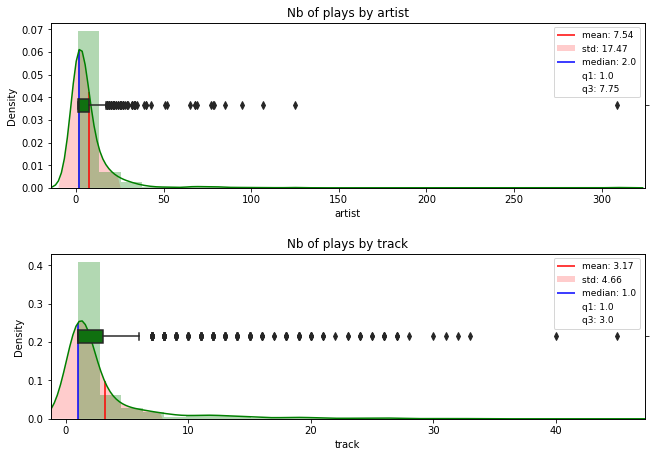

In [28]:
#Let's use the function
fig, ax = plt.subplots(2, 1)

boxdistplot(spotify_tt.artist.value_counts(), ax[0])
plt.title('Nb of plays by artist')

boxdistplot(spotify_tt.track.value_counts(), ax[1])
plt.title('Nb of plays by track')

plt.subplots_adjust(right=1.5, top= 1.5 , hspace=0.4)
plt.show()

Interpretation: 

   Artist: we can see with .describe(), that I listened to 650 different artists. The distribution of the number of plays by artist is highly right-skewed (median = 2, std = 17,47 and mean = 7.54). That means, for the majority of the artists, I listened to them only 2 times. But there are some artists that I listened many, many, times. For example, there is one artist that I listened 309 times between July 2020 and 2021 (wow!).
    
   Track: we can see with .describe(), that I listened to 1543 different tracks. The distribution of the number of plays by track is also highly right-skewed (median = 1, std = 4.66 and mean = 3.17). That means, for the majority of the tracks, I listened to them only once. But there are few tracks that I listened many times. For example, there is one track that I listened 45 times between July 2020 and 2021.

### 3 - Table 2 EDA: <a class="anchor" id="section_3_2"></a>

#### Merging the two tables:

We will merge the two tables to weight my audio features statistics with the number of plays of each track (= each recording in my historical data table). 

In [29]:
#Let's merge the two tables
spotify_features = spotify_tt.merge(features, on = ['track', 'artist'], how='inner')
spotify_features.head()

,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
0,2020-07-16 15:43:00,L'Orchestrina,Paolo Conte,3.314000,0.758,0.819,0.748,-8.698,0.000184,0.578,117.47,1
1,2020-08-15 19:14:00,L'Orchestrina,Paolo Conte,3.311583,0.758,0.819,0.748,-8.698,0.000184,0.578,117.47,1
2,2020-08-17 13:01:00,L'Orchestrina,Paolo Conte,3.311533,0.758,0.819,0.748,-8.698,0.000184,0.578,117.47,1
3,2020-08-23 15:41:00,L'Orchestrina,Paolo Conte,3.311450,0.758,0.819,0.748,-8.698,0.000184,0.578,117.47,1
4,2020-08-25 14:27:00,L'Orchestrina,Paolo Conte,3.314000,0.758,0.819,0.748,-8.698,0.000184,0.578,117.47,1


#### Histograms and boxplots - Part 1 - Defining features and looking for outliers that shouldn't be there: <a class="anchor" id="section_3_2_1"></a>

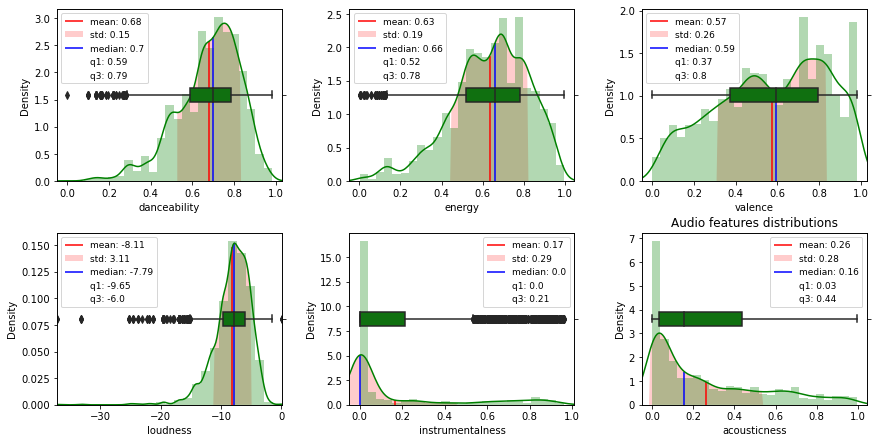

In [30]:
#Let's use the function
fig, ax = plt.subplots(2, 3)

boxdistplot(spotify_features['danceability'], ax[0, 0])
boxdistplot(spotify_features['energy'], ax[0, 1])
boxdistplot(spotify_features['valence'], ax[0, 2])
boxdistplot(spotify_features['loudness'], ax[1, 0])
boxdistplot(spotify_features['instrumentalness'], ax[1, 1])
boxdistplot(spotify_features['acousticness'], ax[1, 2])

plt.title('Audio features distributions')
plt.subplots_adjust(right=2, top= 1.5 , wspace=0.3, hspace=0.3)
plt.show()

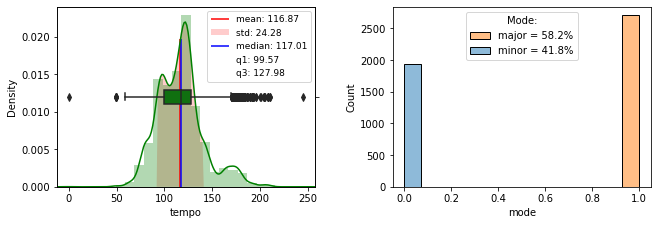

In [31]:
fig, ax = plt.subplots(1, 2, squeeze=False)

boxdistplot(spotify_features['tempo'], ax[0, 0])
sns.histplot(spotify_features, x='mode', hue='mode',  ax=ax[0, 1])
perc = spotify_features['mode'].value_counts(normalize=True).mul(100).round(1).astype(str) + '%'
ax[0, 1].legend( ['major = '+ perc.iloc[0], 'minor = '+ perc.iloc[1]], title='Mode:', loc="upper center")


plt.subplots_adjust(right=1.5, top= 0.75 , wspace=0.3, hspace=0.3)
plt.show()

Tempo: we can see two weird outliers on the boxplot (tempo < 80 and tempo > 200), let's check that:

In [32]:
spotify_features[spotify_features['tempo'] < 80].drop_duplicates(subset = ['track', 'artist']).sort_values('tempo').head(5)

,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
4254,2021-06-07 15:48:00,Lovin' Feeling,French 79,3.415550,0.0000,0.609,0.0000,-8.737,0.627000,0.13500,0.000,1
209,2020-08-12 09:33:00,Awake,Electric Guest,5.014433,0.0993,0.626,0.0399,-8.212,0.001610,0.00499,49.452,0
4005,2021-05-06 13:33:00,When I Look Up,Jack Johnson,0.969783,0.5350,0.185,0.4950,-17.911,0.000007,0.70100,58.583,1
2180,2020-10-23 12:06:00,Baby Jane,Arthur Dupont,2.783550,0.6010,0.375,0.4330,-9.164,0.005400,0.64900,59.993,1
2991,2020-12-28 21:43:00,Le chat,Pow Wow,2.848917,0.3830,0.230,0.4660,-12.615,0.000000,0.79600,60.067,1


In [33]:
spotify_features[spotify_features['tempo'] > 200].drop_duplicates(subset = ['track', 'artist']).sort_values('tempo', ascending = False).head(5)

,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
3226,2021-02-20 18:19:00,La main à la pâte,L'Entourloop,2.458050,0.601,0.5260,0.535,-8.521,0.001230,0.096,245.511,0
902,2020-08-15 15:06:00,Hell N Back,Bakar,3.557383,0.584,0.6840,0.720,-4.314,0.000091,0.312,210.164,0
1110,2020-08-15 20:29:00,It's Too Late,Carole King,3.886583,0.450,0.4420,0.812,-12.718,0.005640,0.493,208.282,0
28,2020-07-17 10:05:00,On a marché sur la lune,Voyou,3.611767,0.327,0.8910,0.162,-6.908,0.049600,0.416,204.851,1
50,2020-08-12 07:25:00,Foule sentimentale,Chilly Gonzales,1.783017,0.312,0.0948,0.539,-15.544,0.864000,0.935,204.544,0


Tempo: There seems to be a lot of errors with Spotify's tempo recognition. We have some very low tempo songs that are the real tempo like "When I Look Up" from "Jack Johnson" (I checked on https://songdata.io/track/50lUuRklAxwZ8G7uFzX8td/When-I-Look-Up-by-Jack-Johnson ).

But others that are not ok. For example, the tempo of "Awake" from "Electric Guest" has been divided approximately by 2, its real tempo is 111BPM (on https://songdata.io/track/2QoC2SAaXpLrpVNCGJnrgd/Awake-by-Electric-Guest). 
In fact the tempo is often wrong by half or double due to elements in the music that make the recognition wrong. This is why we have very low tempo but also very high ones.

We will simply drop the extreme values (tempo=0 and tempo = 245) and keep in mind not to take tempo analysis too seriously.

In [34]:
#Let's drop extrem tempo and validate the drop with assert and .shape
print(spotify_features.shape)

spotify_features = spotify_features[spotify_features['tempo'] > 0]
spotify_features = spotify_features[spotify_features['tempo'] <230]
assert spotify_features[spotify_features['tempo'] < 0].empty
assert spotify_features[spotify_features['tempo'] > 230].empty

print(spotify_features.shape)

(4654, 12)
(4652, 12)


Mode: tells if the music is in major mode or minor mode.
58.2% of my spotify history tracks are in major mode.

Danceability: to analyse whether a track is more or less danceable. 
0: not danceable / 1: highly danceable.

We can see one weird outlier on the boxplot, let's check if we have incorrect extreme values. 

In [35]:
#Danceability < 0.2: Music you can't dance so much.
#(Awake and Shadows do not belong here)
spotify_features[(spotify_features['danceability'] < 0.2)].drop_duplicates(subset = ['track', 'artist']).sort_values('danceability').head(5)

,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
209,2020-08-12 09:33:00,Awake,Electric Guest,5.014433,0.0993,0.62600,0.0399,-8.212,0.00161,0.004990,49.452,0
3531,2021-04-09 12:25:00,L'estasi dell'oro,Ennio Morricone,3.384433,0.1360,0.48400,0.1020,-12.945,0.52300,0.715000,99.566,1
1961,2020-08-31 09:44:00,Shadows,Talisco,1.857733,0.1570,0.00476,0.0305,-33.114,0.95500,0.952000,131.936,1
2654,2020-12-12 21:08:00,Between the Buttons,French 79,5.292000,0.1600,0.38600,0.0348,-12.019,0.68000,0.171000,90.379,0
4570,2021-07-08 17:25:00,I'm Alive,The Hives,2.000233,0.1610,0.90200,0.1250,-2.717,0.00560,0.000083,86.841,0


In [36]:
#Danceability > 0.9: Music with a groove or something you can dance to.
#I generally agree with the results but I find it hard to believe that Quick Drive and Liquid sunshine are in the top 5...
#(credits from parcel or last night a dj saved my life are more suited to be in the top 5). 
#It may also depend on the type of dance...
#(Quick Drive and Liquid sunshine do not belong here)
spotify_features[(spotify_features['danceability'] > 0.9)].drop_duplicates(subset = ['track', 'artist']).sort_values('danceability', ascending= False).head(8)

,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
4334,2021-06-09 10:23:00,Quick Drive,Niko B,3.040300,0.980,0.495,0.950,-4.997,0.000118,0.00731,120.036,1
2760,2020-12-16 17:44:00,Credits (feat. Dean Dawson),Parcels,1.042600,0.977,0.499,0.967,-9.662,0.000000,0.16500,115.015,1
4621,2021-07-10 23:43:00,Tshegue,Tshegue,2.983050,0.970,0.526,0.373,-8.392,0.000201,0.01720,123.971,1
4100,2021-05-22 09:51:00,Last Night a D.J. Saved My Life,Indeep,5.659150,0.968,0.345,0.954,-14.170,0.003440,0.15400,109.803,1
1542,2020-08-17 23:07:00,Liquid Sunshine,Biga Ranx,3.224883,0.964,0.406,0.723,-8.259,0.020600,0.03290,112.018,0
1033,2020-08-15 19:04:00,Shake That,Eminem,6.512400,0.963,0.643,0.534,-5.785,0.000049,0.05070,107.005,0
4119,2021-05-29 11:04:00,Best Friend,Foster The People,1.916850,0.959,0.598,0.408,-5.534,0.000000,0.03580,127.028,1
4208,2021-06-05 10:01:00,Yard Man - Original,Chris Michaels,1.659050,0.958,0.799,0.791,-5.126,0.000062,0.02380,127.985,0


Energy: to analyse if it is a track calm/peaceful or a track that will gives you some energy, gives you the urge to clap your hands, jump, run, ...
0: calm music / 1: High energy

In [37]:
#Energy < 0.2: Quiet/peaceful/slow music (it's often piano like Debussy's Claire de Lune).  
#(Nostalgia and Shadows do not belong here).
spotify_features[(spotify_features['energy'] < 0.2)].drop_duplicates(subset = ['track', 'artist']).sort_values('energy').head(5)

,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
746,2020-08-14 20:42:00,Nostalgia,Ronnie Pacitti,3.932650,0.165,0.00243,0.0368,-37.115,0.875,0.985,68.420,1
1961,2020-08-31 09:44:00,Shadows,Talisco,1.857733,0.157,0.00476,0.0305,-33.114,0.955,0.952,131.936,1
3635,2021-04-16 12:11:00,Claire de lune,Claude Debussy,2.534983,0.365,0.01000,0.0364,-25.268,0.924,0.995,135.048,1
3056,2021-01-06 11:48:00,This Way Or Another,Owen Kennedy,0.500783,0.356,0.02160,0.1190,-21.830,0.899,0.995,100.084,1
581,2020-08-13 11:28:00,Overnight,Chilly Gonzales,3.380667,0.388,0.02440,0.1890,-25.245,0.894,0.991,80.132,0


In [38]:
#Energy > 0.9: Music speed/gives you the urge to jump, clap, run,...
#(Ritmo Especial doesn't belong here)
spotify_features[(spotify_features['energy'] > 0.9)].drop_duplicates(subset = ['track', 'artist']).sort_values('energy', ascending= False).head(5)

,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
2428,2020-10-30 12:08:00,Ritmo Especial,Daniel Maloso,4.116833,0.802,0.996,0.496,-4.665,0.861000,0.00939,120.996,1
4200,2021-06-05 09:44:00,TURN OFF THE LIGHTS,Dog Blood,0.500383,0.756,0.994,0.765,-2.466,0.717000,0.00217,128.027,0
2974,2020-12-28 21:09:00,Hippy Hippy Shake,Big Soul,2.846367,0.738,0.994,0.529,-5.445,0.000325,0.04700,129.307,1
4567,2021-07-08 17:17:00,Two-Timing Touch and Broken Bones,The Hives,2.008433,0.342,0.992,0.938,-3.251,0.006040,0.01900,165.230,0
3179,2021-02-04 21:03:00,Banana Split,Lio,1.374283,0.677,0.985,0.967,-3.577,0.005240,0.06350,156.141,1


Valence: to analyse if it is a track that will put you on a good or bad/melancholic mood.
0: bad/melancholic mood / 1: good mood.

In [39]:
#Valence < 0.1: Music dark/bad mood/melancholic 
#(shadows doesn't belong here)
spotify_features[(spotify_features['valence'] < 0.2)].drop_duplicates(subset = ['track', 'artist']).sort_values('valence').head(5)

,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
3172,2021-01-30 15:30:00,Ephos,Flug,7.872167,0.719,0.72700,0.0296,-10.563,0.945000,0.0423,132.000,1
4435,2021-06-12 19:07:00,Queens,The Blaze,2.217667,0.617,0.58900,0.0301,-12.767,0.268000,0.6900,125.058,1
1961,2020-08-31 09:44:00,Shadows,Talisco,1.857733,0.157,0.00476,0.0305,-33.114,0.955000,0.9520,131.936,1
317,2020-08-12 11:22:00,Loreley,Kölsch,5.750000,0.781,0.50900,0.0311,-7.793,0.000022,0.2910,127.964,0
4252,2021-06-07 15:36:00,After Party,French 79,5.455100,0.532,0.57700,0.0335,-12.320,0.905000,0.1640,119.041,1


In [40]:
#Valence > 0.9: Music good mood/happy
spotify_features[(spotify_features['valence'] > 0.9)].drop_duplicates(subset = ['track', 'artist']).sort_values('valence', ascending= False).head(5)

,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
384,2020-08-12 13:11:00,Gotta Go Home,Boney M.,3.760433,0.781,0.936,0.980,-5.843,0.052200,0.2860,131.659,1
934,2020-08-15 17:31:00,September,"Earth, Wind & Fire",3.584700,0.697,0.832,0.979,-7.264,0.001310,0.1680,125.926,1
469,2020-08-12 14:25:00,Passe mon truc,Stupeflip,3.280217,0.679,0.876,0.978,-6.033,0.149000,0.0961,160.459,1
3202,2021-02-05 21:20:00,Je fume pu d'shit,Stupeflip,3.282000,0.894,0.544,0.976,-5.402,0.004150,0.0672,107.292,1
3259,2021-02-20 21:07:00,Pata Pata - Mono Version,Miriam Makeba,2.867800,0.837,0.853,0.975,-5.417,0.000003,0.6150,126.845,1


Loudness: to analyse if the track is more or less loud. 
Range: -60 and 0 (db).

In [41]:
#loudness < -20: Music like piano songs that are not loud
#(Nostalgia and shadows do not belong here)
spotify_features[(spotify_features['loudness'] < -20)].drop_duplicates(subset = ['track', 'artist']).sort_values('loudness').head(5)

,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
746,2020-08-14 20:42:00,Nostalgia,Ronnie Pacitti,3.932650,0.165,0.00243,0.0368,-37.115,0.875,0.985,68.420,1
1961,2020-08-31 09:44:00,Shadows,Talisco,1.857733,0.157,0.00476,0.0305,-33.114,0.955,0.952,131.936,1
3635,2021-04-16 12:11:00,Claire de lune,Claude Debussy,2.534983,0.365,0.01000,0.0364,-25.268,0.924,0.995,135.048,1
581,2020-08-13 11:28:00,Overnight,Chilly Gonzales,3.380667,0.388,0.02440,0.1890,-25.245,0.894,0.991,80.132,0
1271,2020-08-16 15:45:00,The Entertainer,Liberace,2.045517,0.466,0.15000,0.7960,-24.581,0.877,0.992,159.517,1


In [42]:
#Loudness > -5 : Music like rock songs that are loud
spotify_features[(spotify_features['loudness'] > -5)].drop_duplicates(subset = ['track', 'artist']).sort_values('loudness', ascending = False).head(5)

,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
205,2020-08-12 09:28:00,Menez daou,Les Ramoneurs De Menhirs,5.162217,0.442,0.946,0.660,0.074,0.00767,0.09380,177.137,1
4357,2021-06-09 12:06:00,Poundshop Kardashians,Sam Fender,2.654917,0.557,0.875,0.770,-1.596,0.00000,0.04190,138.023,0
4338,2021-06-09 10:41:00,Bear Claws,The Academic,3.568633,0.552,0.877,0.628,-1.879,0.00000,0.01420,97.056,0
2956,2020-12-28 20:38:00,Louxor J'Adore - Katerine vs Joachim Garraud,Philippe Katerine,3.118433,0.471,0.929,0.696,-1.897,0.49600,0.00217,134.717,0
4198,2021-06-05 09:42:00,BREAK LAW,Dog Blood,0.512767,0.679,0.950,0.120,-2.247,0.00205,0.01480,107.994,1


Instrumentalness: to analyse if a track has vocals or not.
0: A lots of vocals / 1: no vocals.

In [43]:
#Instru 0.9 - 1: no vocals at all.
#(shadows doesn't belong here)
spotify_features[(spotify_features['instrumentalness'] > 0.5)].drop_duplicates(subset = ['track', 'artist']).sort_values('instrumentalness', ascending=False).head(5)

,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
4639,2021-07-11 12:17:00,Bilboquet (Sirba),Polo & Pan,3.269100,0.803,0.78500,0.3270,-7.757,0.962,0.483,100.028,0
3588,2021-04-13 17:30:00,Where Is My Mind,Maxence Cyrin,2.752667,0.333,0.11400,0.0566,-21.255,0.960,0.906,141.839,1
3629,2021-04-16 11:29:00,Walk to School,Philip Glass,1.742283,0.225,0.03680,0.0388,-23.039,0.956,0.977,169.851,0
1961,2020-08-31 09:44:00,Shadows,Talisco,1.857733,0.157,0.00476,0.0305,-33.114,0.955,0.952,131.936,1
3023,2020-12-31 17:14:00,Hip Hop First of All,Guts,2.675700,0.652,0.54900,0.1660,-9.090,0.950,0.218,83.007,0


In [44]:
#Instru 0.5 - 0.9: Almost no voice. 
#Mostly it's techno/electro music with voice samples as in CamelPhat's Cola. 
#Or a song with just a few backing vocals like l'estasi dell'oro.
spotify_features[(spotify_features['instrumentalness'] > 0.5)].drop_duplicates(subset = ['track', 'artist']).sort_values('instrumentalness').head(5)

,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
869,2020-08-15 14:18:00,Cola,CamelPhat,3.728650,0.706,0.740,0.444,-7.904,0.512,0.02450,122.007,1
3531,2021-04-09 12:25:00,L'estasi dell'oro,Ennio Morricone,3.384433,0.136,0.484,0.102,-12.945,0.523,0.71500,99.566,1
3467,2021-03-27 21:49:00,Salam Aleykoum,Salut C'est Cool,5.450317,0.690,0.963,0.154,-6.341,0.527,0.00776,138.001,1
2158,2020-10-14 17:24:00,Pigalle,Bellaire,4.169933,0.906,0.661,0.228,-7.532,0.527,0.00417,124.987,0
2606,2020-12-09 11:57:00,Enoi - Âme Live Version,Âme,0.727617,0.709,0.736,0.389,-9.095,0.531,0.00849,124.407,1


In [45]:
#Instru 0.1 - 0.5: Music with more vocals but still a lot of techno/electro.
spotify_features[(spotify_features['instrumentalness'] > 0.1)].drop_duplicates(subset = ['track', 'artist']).sort_values('instrumentalness').head(5)

,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
4424,2021-06-12 18:14:00,Don't Wanna Dance,Boston Bun,2.823367,0.797,0.827,0.680,-5.607,0.101,0.03340,121.979,1
3119,2021-01-21 04:49:00,Dr. Greenthumb,Cypress Hill,3.154217,0.803,0.547,0.144,-8.779,0.102,0.04820,103.853,0
3323,2021-03-13 04:04:00,Bout de bois,Salut C'est Cool,3.447933,0.702,0.758,0.134,-10.740,0.104,0.00295,165.963,1
9,2020-07-17 09:32:00,Le métro et le bus,Lewis OfMan,0.925917,0.592,0.576,0.276,-8.279,0.107,0.49600,110.045,1
1604,2020-08-21 10:33:00,Il fait chaud,Corine,2.294550,0.679,0.834,0.453,-6.947,0.108,0.02100,108.000,0


In [46]:
#Instru 0 - 0.1 : Songs with a lot of vocals.
spotify_features[(spotify_features['instrumentalness'] < 0.1)].drop_duplicates(subset = ['track', 'artist']).sort_values('instrumentalness').head(5)

,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
3054,2020-12-31 19:34:00,Chérie,Amadou & Mariam,1.943750,0.834,0.964,0.680,-3.822,0.0,0.1980,127.994,1
3126,2021-01-30 04:38:00,Les prisons de Nantes,Tri Yann,2.345400,0.528,0.395,0.962,-10.130,0.0,0.8040,161.460,1
3065,2021-01-14 23:26:00,Is This Love,Bob Marley & The Wailers,3.845550,0.776,0.559,0.758,-8.375,0.0,0.1100,122.242,0
3063,2021-01-14 23:22:00,One Love / People Get Ready - Medley,Bob Marley & The Wailers,2.882217,0.725,0.523,0.950,-9.593,0.0,0.0783,76.292,1
3055,2021-01-03 18:34:00,You Really Got Me - Mono Mix,The Kinks,2.237717,0.573,0.939,0.963,-6.441,0.0,0.4930,137.382,1


Acousticness: to analyse if the track is more or less acoustic.
0: not accoustic / 1: 100% acoustic.

In [47]:
#Acousticness < 0.2 : Not acoustic music (like band music or electro/techno)
spotify_features[(spotify_features['acousticness'] < 0.2)].drop_duplicates(subset = ['track', 'artist']).sort_values('acousticness').head(5)

,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
4569,2021-07-08 17:23:00,Good Samaritan,The Hives,3.115000,0.186,0.924,0.2570,-3.830,0.00968,0.000002,149.966,1
4231,2021-06-05 10:15:00,Robot Rock,Daft Punk,0.802233,0.590,0.787,0.5980,-5.766,0.84500,0.000007,111.926,1
1510,2020-08-17 18:29:00,Hellifornia,Gesaffelstein,1.349033,0.537,0.784,0.0384,-3.734,0.28800,0.000009,93.988,1
4371,2021-06-09 12:57:00,Mixtape 2003,The Academic,3.404167,0.288,0.933,0.3450,-4.120,0.33300,0.000013,167.109,1
3625,2021-04-15 18:19:00,Force majeure,Gaspard Augé,3.435283,0.578,0.696,0.2190,-6.866,0.87400,0.000048,119.999,1


In [48]:
#Acousticness > 0.9 : Highly acoustic music (like piano)
spotify_features[(spotify_features['acousticness'] > 0.9)].drop_duplicates(subset = ['track', 'artist']).sort_values('acousticness', ascending= False).head(5)

,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
3635,2021-04-16 12:11:00,Claire de lune,Claude Debussy,2.534983,0.365,0.0100,0.0364,-25.268,0.924,0.995,135.048,1
3056,2021-01-06 11:48:00,This Way Or Another,Owen Kennedy,0.500783,0.356,0.0216,0.1190,-21.830,0.899,0.995,100.084,1
1271,2020-08-16 15:45:00,The Entertainer,Liberace,2.045517,0.466,0.1500,0.7960,-24.581,0.877,0.992,159.517,1
581,2020-08-13 11:28:00,Overnight,Chilly Gonzales,3.380667,0.388,0.0244,0.1890,-25.245,0.894,0.991,80.132,0
3630,2021-04-16 11:35:00,Gaze,Moux,2.669333,0.574,0.0577,0.0849,-22.165,0.912,0.991,140.994,0


Ok, so we have to drop the outliers that have ended up in places where they don't belong, to get better results. It's like the tempo, sometimes the recognition is wrong because of certain elements of the music. 

In [49]:
#Let's drop those records and validate the drop with .shape and assert
print(spotify_features.shape)
spotify_features = spotify_features[spotify_features['track'] != 'Shadows']
spotify_features = spotify_features[spotify_features['track'] != 'Nostalgia']
spotify_features = spotify_features[spotify_features['track'] != 'Awake']
spotify_features = spotify_features[spotify_features['track'] != 'Quick Drive']
spotify_features = spotify_features[spotify_features['track'] != 'Liquid sunshine']
spotify_features = spotify_features[spotify_features['track'] != 'Ritmo Especial']
print(spotify_features.shape)
assert spotify_features[(spotify_features['track'] == 'Shadows')| (spotify_features['track'] == 'Nostalgia') | (spotify_features['track'] == 'Awake')].empty


(4652, 12)
(4638, 12)


#### Rescaling the audio features for comparison: 

To be able to compare the features, we need to convert them to the same scale. We can use the min max scaling technique to convert their values between 0 and 1.
(They are all already between 0 and 1, except for the loudness, so I prefer to scale them back.)

In [50]:
from sklearn.preprocessing import MinMaxScaler
#Let's rescale the features
min_max_scaler_tt = MinMaxScaler()

spotify_features.iloc[:,4:10]=min_max_scaler_tt.fit_transform(spotify_features.iloc[:,4:10])
spotify_features.head()

,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
0,2020-07-16 15:43:00,L'Orchestrina,Paolo Conte,3.314000,0.739596,0.822154,0.755892,0.653855,0.000191,0.580904,117.47,1
1,2020-08-15 19:14:00,L'Orchestrina,Paolo Conte,3.311583,0.739596,0.822154,0.755892,0.653855,0.000191,0.580904,117.47,1
2,2020-08-17 13:01:00,L'Orchestrina,Paolo Conte,3.311533,0.739596,0.822154,0.755892,0.653855,0.000191,0.580904,117.47,1
3,2020-08-23 15:41:00,L'Orchestrina,Paolo Conte,3.311450,0.739596,0.822154,0.755892,0.653855,0.000191,0.580904,117.47,1
4,2020-08-25 14:27:00,L'Orchestrina,Paolo Conte,3.314000,0.739596,0.822154,0.755892,0.653855,0.000191,0.580904,117.47,1


In [51]:
spotify_features.describe()

,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
count,4638.000000,4638.000000,4638.000000,4638.000000,4638.000000,4638.000000,4638.000000,4638.000000,4638.000000
mean,3.488633,0.646954,0.634980,0.572766,0.678102,0.173087,0.264564,116.959213,0.581716
std,1.507279,0.176804,0.189612,0.271474,0.117976,0.296806,0.276047,24.042351,0.493330
min,0.500017,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,58.583000,0.000000
25%,2.737333,0.536266,0.519309,0.359217,0.616151,0.000013,0.033063,99.822250,0.000000
50%,3.469892,0.673603,0.659553,0.594907,0.690040,0.002401,0.157787,117.010000,1.000000
75%,4.216121,0.774078,0.782520,0.806397,0.760398,0.212058,0.438943,127.982000,1.000000
max,30.725217,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,210.164000,1.000000


Ok, now let's analyse the correlation between features

#### Correlation matrix of the audio features: <a class="anchor" id="section_3_2_2"></a>

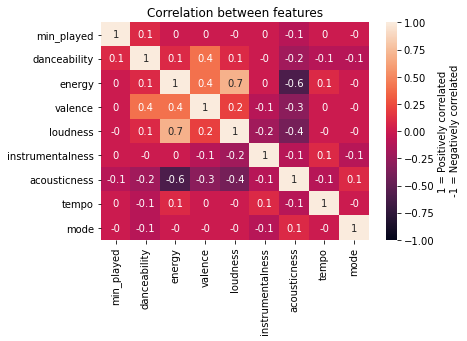

In [52]:
sns.heatmap(round(spotify_features.corr(),1),vmin=-1, vmax=1, annot = True,
            cbar_kws={'label': '1 = Positively correlated\n -1 = Negatively correlated'})
plt.title('Correlation between features')
plt.show()

**Correlation results:**

1 - Valence is a bit positively correlated (0.4) with danceability and energy. If the music scores high on danceability or energy, it is more likely to score high on valence as well. In other words, if music makes you want to jump (energy) or dance (danceability), it will also put you in a good mood (valence).

2 - Loudness is quite positively correlated (0.7) with energy. If the music scores high on loudness, it is more likely to score high high on energy as well. In other words, more the music is loud, more it gives you the urge to jump/clap (energy).

3 - Acousticness is somehow negatively correlated (-0.6) with energy. If music scores high on acousticness, it is more likely to score low on energy. In other words, the more acoustic the music, the less likely it is to make you want to jump/clap (energy). 

4 - Therefore, Acousticness is also a bit negatively correlated (-0.4) with loudness. If music scores high on acousticness, it is more likely to score low on loudness. In other words, less the music will be acoustic (like a rock band), louder it is more likely to be. 

So, for example, if you are listening to 100% piano music (very acoustic), it is more likely that the music does not have much energy and therefore not much valence. In addition, this music should not be too loud. At the end, this piano music is more likely to be quiet/peaceful/slow and should put you in a somewhat melancholic mood. 

#### Histograms and Boxplots - Part 2 - Understanding my audio features preferences: <a class="anchor" id="section_3_2_3"></a>

Let's replot the histograms and boxplots now that we have eliminated some weird outliers:

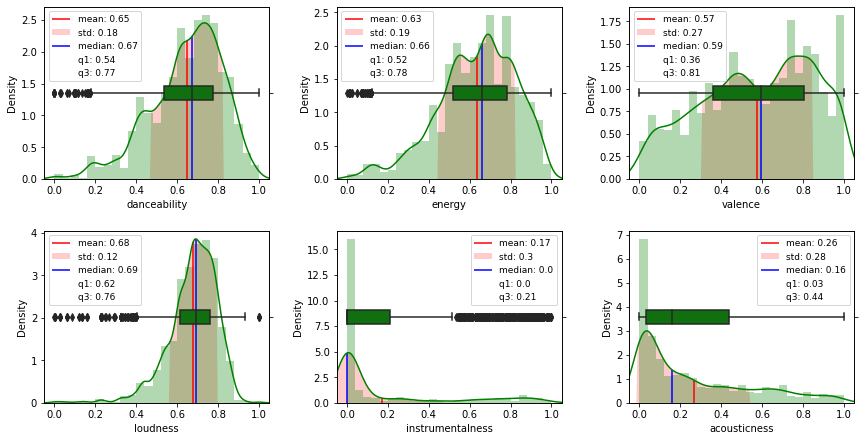

In [53]:

fig, ax = plt.subplots(2, 3)

boxdistplot(spotify_features['danceability'], ax[0, 0])
boxdistplot(spotify_features['energy'], ax[0, 1])
boxdistplot(spotify_features['valence'], ax[0, 2])
boxdistplot(spotify_features['loudness'], ax[1, 0])
boxdistplot(spotify_features['instrumentalness'], ax[1, 1])
boxdistplot(spotify_features['acousticness'], ax[1, 2])

plt.subplots_adjust(right=2, top= 1.5 , wspace=0.3, hspace=0.3)
plt.show()

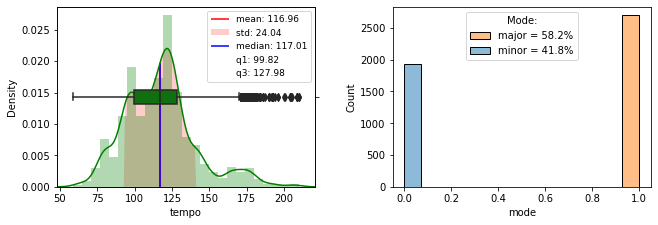

In [54]:
fig, ax = plt.subplots(1, 2, squeeze=False)

boxdistplot(spotify_features['tempo'], ax[0, 0])
sns.histplot(spotify_features, x='mode', hue='mode',  ax=ax[0, 1])
#spotify_features['mode'].loc[spotify_features['mode']==1].count()
perc = spotify_features['mode'].value_counts(normalize=True).mul(100).round(1).astype(str) + '%'
ax[0, 1].legend( ['major = '+ perc.iloc[0], 'minor = '+ perc.iloc[1]], title='Mode:', loc="upper center")


plt.subplots_adjust(right=1.5, top= 0.75 , wspace=0.3, hspace=0.3)
plt.show()

**My audio features results:** <a class="anchor" id="eda"></a>

Danceability: My musical tastes in terms of danceability are diverse (std = 0.18) but it seems that I have a small preference for music that is quite danceable (mean = 0.65).

Energy: As for dancability, my musical tastes in terms of energy are diversified (std = 0.19) and I have a small preference for music that has some energy (mean = 0.63).

Valence: Regarding valence, my musical tastes are very diversified (std = 0.27 and mean = 0.57). We can see two peaks/modes which indicate that I like music with a high valence score around 0.8 but also calm/melancholic music with a valence score around 0.45. (You can even see that I sometimes like to listen to music with a very low valence score. This is for example dark techno/electro music like 'Gesaffelstein').

Loudness: My musical taste in terms of loudness is not very diverse (std = 0.12), I like music that is quite loud (mean = 0.68).

Instrumentalness: My data in terms of instrumentalness are highly right-skewed (median = 0, mean = 0.17 and std = 0.3).  This indicates that the majority of my music has an instrumentality score of 0 (median=0) but as it is very diverse (std = 0.3 and mean = 0.17), we can also find some music with a very high instrumentality score. In other words, this means that I prefer real song/music with vocals (instrumentalness = 0) but I also like techo/electro music without any vocals like 'Bilboquet (Sirba)' from 'Polo & Pan' or 100% piano music (without vocals).

Acousticness: My data in terms of acousticness are also right-skewed (median = 0.16, mean = 0.26 and std = 0.28).  This indicates that the majority of my music has a low acousticness score (median=0.16) but as it is diverse (std = 0.28 and mean = 0.26), we can also find some music with a very high acousticness score. In other words, this means that I prefer real band music or electro/techno music (acousticness < 0.2) but I also like acoustic and quiet music like piano.

Tempo: As we said before, we have to take this tempo analysis very carefully as Spotify's API seems to have a lot of errors in tempo recognition. But to give a general idea, it seems I like all types of tempo, but I have a preference for tempo around 117 BPM (std = 24, mean and median = 117).

Mode: I seem to prefer music in major mode (58.2% of all my music). But since it's not a big difference, it means that I don't really care about the mode of the music.

So, to sum up: My musical tastes are very diverse. I like all types of tempo and mode, although I have a slight preference for music in major mode with a tempo around 117BPM. I listen to music that is more or less danceable, music with a lot of energy but also sometime calm music, music with a good valence but also music that is more melancholic, chill or even dark sometimes. I like loud music and I prefer music with voices that are not acoustic. However, I also sometimes like music without vocals to focus on the different sounds like electro/techno music or acoustic music that is calm/chill like piano music.

In [55]:
#Ok, we will save that and start the analysis:
#let's save it into a new csv file:
spotify_features.to_csv(r'C:\Users\Tristan\Documents\DATA\spotify_project\spotify_features_clean.csv', index=False)

## C) Analysis Part 1 - Tops<a class="anchor" id="chapter4"></a>

In this first part of the analysis, my objectives are :
- To know which are my top artists and my top tracks.
- To see my music consumption on spotify per month during the analysis period (2020-07/2021-07).
- To see when I listen to the most spotify during the week (by day of the week and by hour).

For this part, we will use the first table 'spotify_tt' and not the full table with the features because 'spotify_tt' contains all my historical data, even those for which the spotify API could not find any information. As a reminder, we had to delete 85 records after we merged the two tables because they were tracks from spotify_tt for which the api could not find any features.

In [56]:
#We need to set datetime as index
spotify_tt.set_index('datetime', inplace = True)
spotify_tt.head()

,track,artist,min_played
datetime,,,
2020-07-16 15:43:00,L'Orchestrina,Paolo Conte,3.314000
2020-07-17 09:29:00,fancy,Isaac Delusion,0.531017
2020-07-17 09:31:00,Plein de bisous,Lewis OfMan,1.056267
2020-07-17 09:32:00,Le métro et le bus,Lewis OfMan,0.925917
2020-07-17 09:36:00,La légende urbaine,Voyou,3.779767


### 1 - Top artists: <a class="anchor" id="section_4_1"></a>

In [57]:
#Top 10 artist by nb of plays:
top10_artist_count = spotify_tt['artist'].value_counts().reset_index().head(10)
top10_artist_count.columns = ['artist', 'nb_of_plays']
top10_artist_count

,artist,nb_of_plays
0,The Lumineers,309
1,Jungle,125
2,La Femme,107
3,Guts,95
4,L'Impératrice,85
5,easy life,79
6,Parcels,78
7,Lil Dicky,77
8,Polo & Pan,69
9,Isaac Delusion,68


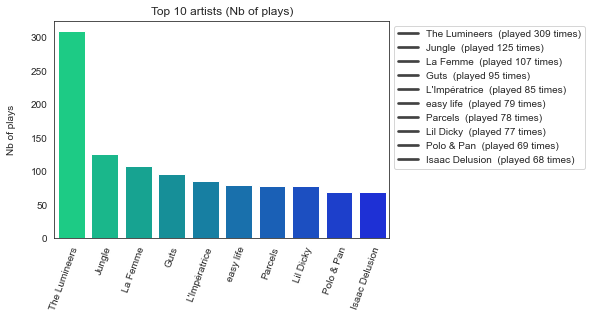

In [58]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style("white")
sns.barplot(x= 'artist', y= 'nb_of_plays', data= top10_artist_count, palette='winter_r')
plt.xticks(rotation=70,  ha="right", rotation_mode="anchor")
plt.xlabel(None)
plt.ylabel('Nb of plays\n')
plt.title('Top 10 artists (Nb of plays)')

top10_artist_count['P'] = top10_artist_count.nb_of_plays.astype('str')
plt.legend( top10_artist_count['artist']+ '  (played '+ top10_artist_count['P'] +' times)',loc = 2, bbox_to_anchor = (1,1))

plt.savefig(r'C:\Users\Tristan\Documents\DATA\spotify_project\topartist1.png', bbox_inches='tight')
plt.show()


In [59]:
#Top 10 artist by nb of hours:
top10_artist_h = spotify_tt.groupby('artist')['min_played'].sum().div(60).round(1).sort_values(ascending=False).reset_index().head(10)
top10_artist_h.columns = ['artist', 'nb_of_hours']
top10_artist_h

,artist,nb_of_hours
0,The Lumineers,16.9
1,Jungle,6.9
2,La Femme,6.3
3,Guts,6.1
4,L'Impératrice,5.6
5,Lil Dicky,5.0
6,Parcels,4.9
7,Polo & Pan,4.8
8,Isaac Delusion,4.5
9,easy life,3.9


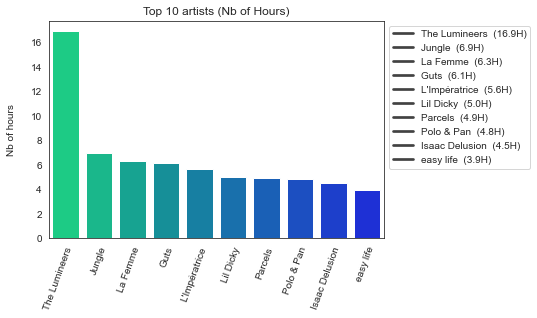

In [60]:
sns.set_style("white")
sns.barplot(x= 'artist', y= 'nb_of_hours', data= top10_artist_h, palette='winter_r')
plt.xticks(rotation=70,  ha="right", rotation_mode="anchor")
plt.xlabel(None)
plt.ylabel('Nb of hours\n')
plt.title('Top 10 artists (Nb of Hours)')

top10_artist_h['H'] = top10_artist_h.nb_of_hours.astype('str')
plt.legend( top10_artist_h['artist']+ '  ('+ top10_artist_h['H'] +'H)',  loc = 2, bbox_to_anchor = (1,1))

plt.savefig(r'C:\Users\Tristan\Documents\DATA\spotify_project\topartist2.png', bbox_inches='tight')
plt.show()

### 2 - Top tracks: <a class="anchor" id="section_4_2"></a>

In [61]:
#Top 10 track by nb of plays:
top10_track_count = spotify_tt[['track', 'artist']].value_counts().reset_index().head(10)
top10_track_count.columns = ['track','artist' ,'nb_of_plays']
top10_track_count

,track,artist,nb_of_plays
0,Disco Inferno,The Trammps,40
1,Sledgehammer,Peter Gabriel,33
2,Nomalizo,Letta Mbulu,32
3,Nothing But A Heartache,The Flirtations,31
4,Last Train to London,Electric Light Orchestra,30
5,Isabella,Isaac Delusion,28
6,Idol,Mind Enterprises,27
7,Baianá,Bakermat,27
8,(More and More) It Ain't Easy,Jungle,27
9,Maryland,Elephanz,26


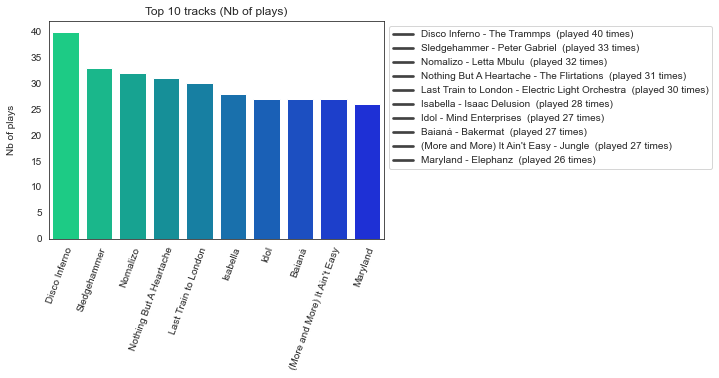

In [62]:
sns.set_style("white")
sns.barplot(x= 'track', y= 'nb_of_plays', data= top10_track_count, palette='winter_r')
plt.xticks(rotation=70,  ha="right", rotation_mode="anchor")
plt.xlabel(None)
plt.ylabel('Nb of plays\n')
plt.title('Top 10 tracks (Nb of plays)')

top10_track_count['P'] = top10_track_count.nb_of_plays.astype('str')
plt.legend(top10_track_count['track'] + ' - ' + top10_track_count['artist']+ '  (played '+ top10_track_count['P'] +' times)',  loc = 2, bbox_to_anchor = (1,1))

plt.savefig(r'C:\Users\Tristan\Documents\DATA\spotify_project\toptrack1.png', bbox_inches='tight')
plt.show()

In [63]:
#Top 10 track by nb of hours:
top10_track_h = spotify_tt.groupby(['track', 'artist'])['min_played'].sum().div(60).round(1).sort_values(ascending=False).reset_index().head(10)
top10_track_h.columns = ['track', 'artist', 'nb_of_hours']
top10_track_h

,track,artist,nb_of_hours
0,Here Comes That Sound Again,Love De-Luxe,2.6
1,Sledgehammer,Peter Gabriel,2.5
2,Nomalizo,Letta Mbulu,2.5
3,Isabella,Isaac Delusion,2.3
4,Disco Inferno,The Trammps,2.2
5,I Feel Love,Donna Summer,2.0
6,Last Train to London,Electric Light Orchestra,2.0
7,Leader Of The Landslide,The Lumineers,1.9
8,Esperar Pra Ver,Poolside,1.7
9,Psycho Killer - 2005 Remaster,Talking Heads,1.6


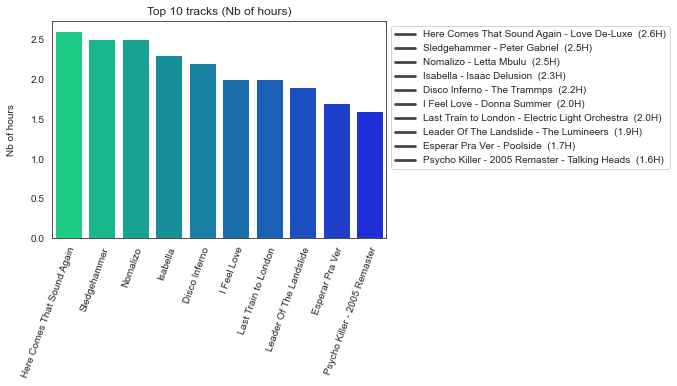

In [64]:
sns.set_style("white")
sns.barplot(x= 'track', y= 'nb_of_hours', data= top10_track_h, palette='winter_r')
plt.xticks(rotation=70,  ha="right", rotation_mode="anchor")
plt.xlabel(None)
plt.ylabel('Nb of hours\n')
plt.title('Top 10 tracks (Nb of hours)')

top10_track_h['H'] = top10_track_h.nb_of_hours.astype('str')
plt.legend(top10_track_h['track'] + ' - ' + top10_track_h['artist']+ '  ('+ top10_track_h['H'] +'H)',  loc = 2, bbox_to_anchor = (1,1))

plt.savefig(r'C:\Users\Tristan\Documents\DATA\spotify_project\toptrack2.png', bbox_inches='tight')
plt.show()

### 3 - Top tracks of my top 1 artist: <a class="anchor" id="section_4_3"></a>

In [65]:
#Top 10 track of The Lumineers by nb of plays:

Top1 = spotify_tt.loc[spotify_tt.artist.str.contains('Lumineers'), 'track'].value_counts().reset_index().head(10)
Top1.columns = ['track', 'nb_of_plays']
Top1

,track,nb_of_plays
0,Gloria,22
1,Leader Of The Landslide,20
2,Sleep On The Floor,20
3,Ophelia,19
4,It Wasn't Easy To Be Happy For You,19
5,Soundtrack Song - Bonus Track,18
6,Cleopatra,17
7,April,17
8,Salt And The Sea,16
9,Patience,16


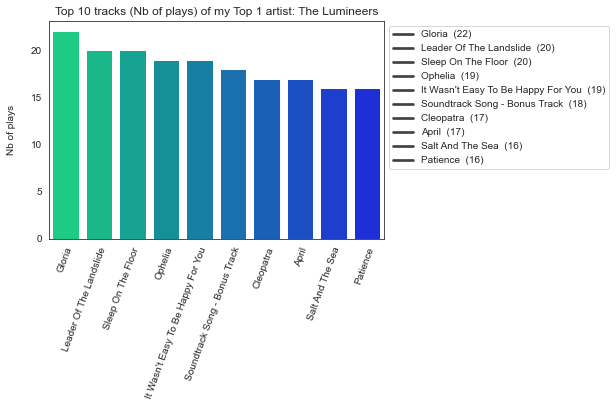

In [66]:
sns.set_style("white")
sns.barplot(x= 'track', y= 'nb_of_plays', data= Top1, palette='winter_r')
plt.xticks(rotation=70,  ha="right", rotation_mode="anchor")
plt.xlabel(None)
plt.ylabel('Nb of plays\n')
plt.title('Top 10 tracks (Nb of plays) of my Top 1 artist: The Lumineers')

Top1['P'] = Top1.nb_of_plays.astype('str')
plt.legend( Top1['track']+ '  ('+ Top1['P'] +')',  loc = 2, bbox_to_anchor = (1,1))

plt.savefig(r'C:\Users\Tristan\Documents\DATA\spotify_project\toptracktopartist.png', bbox_inches='tight')
plt.show()

### 4 - Creating a wordcloud visual with my top 100 artists: <a class="anchor" id="section_4_4"></a>

(-0.5, 999.5, 599.5, -0.5)

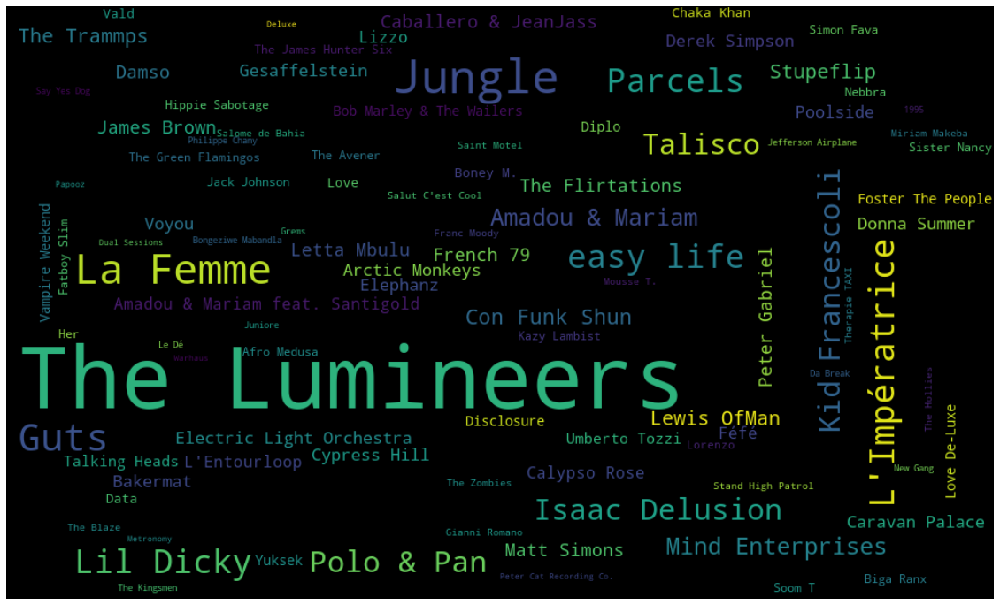

In [67]:
#Let's create a wordcloud visual with my top 100 artists for the project image on my website
from wordcloud import WordCloud

wc_artist = spotify_tt['artist'].value_counts().head(100)
fig, ax = plt.subplots(figsize=(20,15))
wordcloud = WordCloud(width=1000,height=600, max_words=100,relative_scaling=0.78,normalize_plurals=False).generate_from_frequencies(wc_artist)
ax.imshow(wordcloud, interpolation='bilinear')

plt.savefig(r'C:\Users\Tristan\Documents\DATA\spotify_project\wc_top100.png', bbox_inches='tight')
plt.axis(False)

### 5 - My music consumption on spotify per month during the analysis period (2020-07/2021-07): <a class="anchor" id="section_4_5"></a>

In [68]:
month_h = spotify_tt.min_played.resample('M').sum().div(60).reset_index()
month_h.columns = ['month', 'nb_of_hours']
month_h

,month,nb_of_hours
0,2020-07-31,0.759305
1,2020-08-31,54.920501
2,2020-09-30,11.011556
3,2020-10-31,11.429484
4,2020-11-30,5.951911
5,2020-12-31,29.259204
6,2021-01-31,12.622811
7,2021-02-28,14.628442
8,2021-03-31,19.739608
9,2021-04-30,29.808107


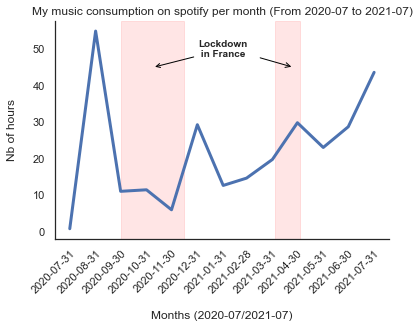

In [69]:
from datetime import datetime

sns.set_theme(style="white")
fig, ax = plt.subplots()
fig = sns.lineplot(x= 'month', y = 'nb_of_hours' ,data = month_h, linewidth = 3)
sns.despine()
plt.xticks(month_h.month, rotation = 45, ha="right", rotation_mode="anchor")
plt.xlabel('\nMonths (2020-07/2021-07)')
plt.ylabel('Nb of hours\n')
ax.axvspan(datetime(2020,9,30), datetime(2020,12,15), alpha=0.1, color='red')
ax.axvspan(datetime(2021,4,3), datetime(2021,5,3), alpha=0.1, color='red')

ax.annotate('Lockdown\n in France',
            fontsize=10,
            fontweight='demi',
            xy=(datetime(2020,11,8), 45),  
            xycoords='data',
            xytext=(45, 10),      
            textcoords='offset points',
            arrowprops=dict(arrowstyle="->", color = 'black')) 
ax.annotate('',
            xy=(datetime(2021,4,25), 45),  
            xycoords='data',
            xytext=(-35, 10),      
            textcoords='offset points',
            arrowprops=dict(arrowstyle="->", color = 'black')) 

plt.title('My music consumption on spotify per month (From 2020-07 to 2021-07)')

plt.savefig(r'C:\Users\Tristan\Documents\DATA\spotify_project\months.png', bbox_inches='tight')
plt.show()

Interpretation: 
    
   We can see that I listen to spotify the most during the summer or during the Christmas and new eve period.
   We can also see that during the lockdown of 2020-09/2020-12 my music consumption on spotify dropped (It may not be a cause and effect relationship but it is a correlation). The 2021 lockdown does not seem to have affected my consumption.

### 6 - Which day I listen to spotify the most?: <a class="anchor" id="section_4_6"></a>

In [70]:
day_h = spotify_tt.groupby(spotify_tt.index.date)['min_played'].sum().div(60).reset_index()
day_h.columns = ['weekday', 'nb_of_hours']
day_h['weekday'] = pd.to_datetime(day_h['weekday'])

weekday_h = day_h.groupby(day_h['weekday'].apply(lambda x: x.day_name()))['nb_of_hours'].mean().reset_index()
weekday_h['weekday'] = pd.Categorical(weekday_h['weekday'], ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
weekday_h = weekday_h.sort_values('weekday')
weekday_h

,weekday,nb_of_hours
1,Monday,1.641194
5,Tuesday,1.540520
6,Wednesday,1.357016
4,Thursday,1.031079
0,Friday,1.559729
2,Saturday,2.104713
3,Sunday,1.293779


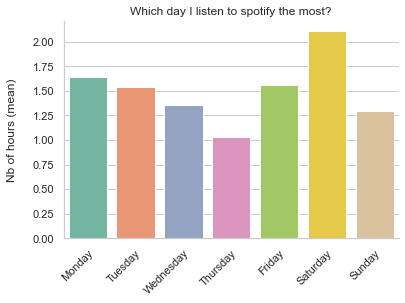

In [71]:
sns.set_theme(style="whitegrid")
fig, ax = plt.subplots()
fig = sns.barplot(x= 'weekday', y = 'nb_of_hours' ,data = weekday_h, palette="Set2")
sns.despine()
plt.xticks(rotation = 45, ha="right", rotation_mode="anchor")
plt.xlabel(None)
plt.ylabel('Nb of hours (mean)\n')
plt.title('Which day I listen to spotify the most?')

plt.savefig(r'C:\Users\Tristan\Documents\DATA\spotify_project\days.png', bbox_inches='tight')
plt.show()

Interpretation: 
    
   Saturday seems to be my favourite day to listen to music on spotify and Thursday the day I listen to the least.

### 7 - Heatmap: When do I listen to Spotify the most during the week (by days and hours)?: <a class="anchor" id="section_4_7"></a>

In [72]:
spotify_tt.reset_index(inplace=True)
spotify_tt['weekday'] = spotify_tt.datetime.apply(lambda x: x.day_name())
spotify_tt['hour'] = pd.DatetimeIndex(spotify_tt["datetime"]).hour
hmap_hourday = spotify_tt.groupby(['hour', 'weekday'])['min_played'].sum().div(60).reset_index()
hmap_hourday.columns = ['hour', 'weekday', 'nb_of_hours']
hmap_hourday['weekday'] = pd.Categorical(hmap_hourday['weekday'], ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
hmap_hourday = hmap_hourday.sort_values(['hour', 'weekday'])
hmap_hourday_pivot = hmap_hourday.pivot("hour", 'weekday', 'nb_of_hours')
hmap_hourday_pivot

weekday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
hour,,,,,,,
0,NaN,0.090550,1.145496,0.950365,1.861331,0.791024,2.532518
1,NaN,0.933529,NaN,0.060663,1.664840,0.206100,1.244205
2,NaN,0.013941,NaN,NaN,0.501499,0.948349,NaN
3,NaN,NaN,NaN,0.922506,0.434322,0.997728,0.187207
4,NaN,NaN,NaN,0.986153,0.209337,0.592768,0.962670
5,NaN,NaN,NaN,0.128917,1.419416,1.054068,0.913024
6,NaN,0.848112,NaN,NaN,0.093284,0.543313,NaN
7,2.154869,0.721891,0.315204,0.018783,0.242081,0.053570,0.096764
8,1.769703,0.820385,1.963738,0.815128,2.254765,2.400634,0.180764


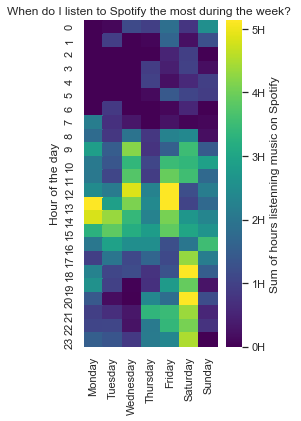

In [73]:
fig, ax = plt.subplots(figsize=(3,6))
ax = sns.heatmap(hmap_hourday_pivot.fillna(0), robust=True, cmap="viridis",cbar_kws={'label': 'Sum of hours listenning music on Spotify'}, ax = ax);
ax.set(title="When do I listen to Spotify the most during the week? ", xlabel=None ,ylabel="Hour of the day")
colorbar = ax.collections[0].colorbar
colorbar.set_ticks([0,1,2,3,4,5])
colorbar.set_ticklabels(['0H', '1H', '2H', '3H', '4H', '5H'])

plt.savefig(r'C:\Users\Tristan\Documents\DATA\spotify_project\heatmap_weekday.png', bbox_inches='tight')
plt.show()

Interpretation: 

We can see that between Monday and Friday, I listen the most between 9H and 15H (my peak hours are during my lunch break: 12H, 13H and 14H). During the weekend, I listen the most the Saturday afternoon after 17H.

## D) Analysis Part 2 - Audio features<a class="anchor" id="chapter5"></a>

In this second part of the analysis, my objectives are:
- Find the tracks corresponding to the max and min for each audio feature.
- Find the audio features corresponding to all the songs I listened to. 
- Compare it to the audio features of my top tracks.
- Analyse the audio features corresponding to the tracks I listen to in the morning, afternoon, evening and night/party.
- Using these findings and only the audio features, find a track I might like to listen to in the morning/afternoon/evening/and during a party at night.

For this part, we will use the full table with the 'spotify_features'.

### 1 - The tracks corresponding to the max and min for each audio feature: <a class="anchor" id="section_5_1"></a>

In [74]:
d = spotify_features.loc[spotify_features.danceability == spotify_features.danceability.max()].drop_duplicates(subset = ['track','artist'])
e = spotify_features.loc[spotify_features.energy == spotify_features.energy.max()].drop_duplicates(subset = ['track','artist'])
v = spotify_features.loc[spotify_features.valence == spotify_features.valence.max()].drop_duplicates(subset = ['track','artist'])
l = spotify_features.loc[spotify_features.loudness == spotify_features.loudness.max()].drop_duplicates(subset = ['track','artist'])
i = spotify_features.loc[spotify_features.instrumentalness == spotify_features.instrumentalness.max()].drop_duplicates(subset = ['track','artist'])
a = spotify_features.loc[spotify_features.acousticness == spotify_features.acousticness.max()].drop_duplicates(subset = ['track','artist'])
dd = spotify_features.loc[spotify_features.danceability == spotify_features.danceability.min()].drop_duplicates(subset = ['track','artist'])
ee = spotify_features.loc[spotify_features.energy == spotify_features.energy.min()].drop_duplicates(subset = ['track','artist'])
vv = spotify_features.loc[spotify_features.valence == spotify_features.valence.min()].drop_duplicates(subset = ['track','artist'])
ll = spotify_features.loc[spotify_features.loudness == spotify_features.loudness.min()].drop_duplicates(subset = ['track','artist'])
ii = spotify_features.loc[spotify_features.instrumentalness == spotify_features.instrumentalness.min()].drop_duplicates(subset = ['track','artist'])
aa = spotify_features.loc[spotify_features.acousticness == spotify_features.acousticness.min()].drop_duplicates(subset = ['track','artist'])

print('\n----MAX danceability')
print(d[['track', 'artist']])
print('\n----MIN danceability')
print(dd[['track', 'artist']])
print('\n ')
print('\n----MAX energy')
print(e[['track', 'artist']])
print('\n----MIN energy')
print(ee[['track', 'artist']])
print('\n ')
print('\n----MAX valence')
print(v[['track', 'artist']])
print('\n----MIN valence')
print(vv[['track', 'artist']])
print('\n ')
print('\n----MAX loudness')
print(l[['track', 'artist']])
print('\n----MIN loudness')
print(ll[['track', 'artist']])
print('\n ')
print('\n----MAX instrumentalness')
print(i[['track', 'artist']])
print('\n----MIN instrumentalness')
print(ii[['track', 'artist']].sample(2, random_state=10))
print('\n ')
print('\n----MAX acousticness')
print(a[['track', 'artist']])
print('\n----MIN acousticness')
print(aa[['track', 'artist']])


----MAX danceability
                            track   artist
2760  Credits (feat. Dean Dawson)  Parcels

----MIN danceability
                  track           artist
3531  L'estasi dell'oro  Ennio Morricone

 

----MAX energy
                    track     artist
2974    Hippy Hippy Shake   Big Soul
4200  TURN OFF THE LIGHTS  Dog Blood

----MIN energy
               track          artist
3635  Claire de lune  Claude Debussy

 

----MAX valence
             track    artist
384  Gotta Go Home  Boney M.

----MIN valence
      track artist
3172  Ephos   Flug

 

----MAX loudness
          track                    artist
205  Menez daou  Les Ramoneurs De Menhirs

----MIN loudness
               track          artist
3635  Claire de lune  Claude Debussy

 

----MAX instrumentalness
                  track      artist
4639  Bilboquet (Sirba)  Polo & Pan

----MIN instrumentalness
            track      artist
1004  Gold Digger  Kanye West
2047    La source        1995

 

----MAX acousticn

### 2 - The audio features corresponding to all the tracks I listened to: <a class="anchor" id="section_5_2"></a>

In [75]:
spotify_features.iloc[:,4:10].mean().reset_index()

,index,0
0,danceability,0.646954
1,energy,0.634980
2,valence,0.572766
3,loudness,0.678102
4,instrumentalness,0.173087
5,acousticness,0.264564


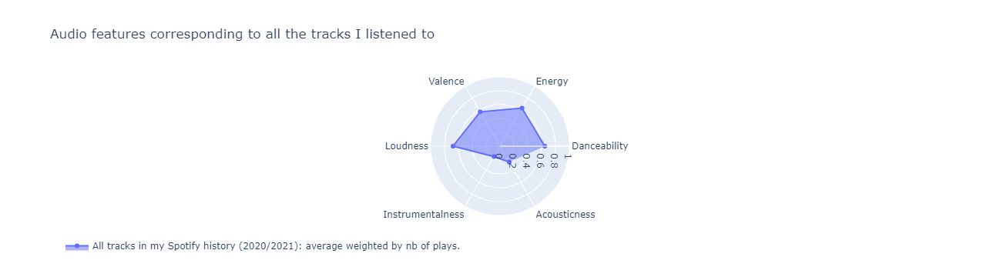

In [113]:
import plotly.graph_objects as go
import plotly.offline as pyo
# Set notebook mode to work in offline
pyo.init_notebook_mode()
categories = ['Danceability', 'Energy', 'Valence', 'Loudness','Instrumentalness', 'Acousticness']

fig = go.Figure()

fig.add_trace(go.Scatterpolar(
      r= spotify_features.iloc[:,4:10].mean(),
      theta=categories,
      fill='toself',
      name = 'All tracks in my Spotify history (2020/2021): average weighted by nb of plays.'
))

fig.update_layout(
    title = "Audio features corresponding to all the tracks I listened to",
    polar=dict(
    radialaxis=dict(
      visible=True,
      range=[0, 1]
    )),
  showlegend=True)

fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=-0.3,
    xanchor="left",
    x=0
))

fig.write_image(r'C:\Users\Tristan\Documents\DATA\spotify_project\all_tracks.png')
pyo.iplot(fig, filename = 'all_tracks')

It seems that plotly graphs cannot be dislayed on github... I haven't found a solution. (It is possible to see the graph using https://nbviewer.jupyter.org/ but not directly on github)
So for github, I'll just upload the graph as a png:

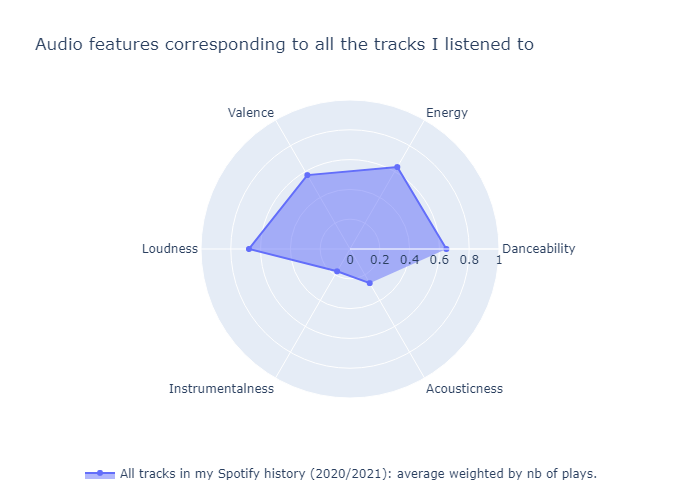

In [114]:
from IPython.display import Image
Image(r'C:\Users\Tristan\Documents\DATA\spotify_project\all_tracks.png')

Interpretation: 
    
Although my tastes are diverse ([see Exploratory Data Analysis results in part B](#eda)), I seem to prefer music that is quite danceable with some energy and also quite loud. I prefer music with a good valence. I prefer music that is not acoustic and that has vocals.

### 3 - Audio features: all tracks VS  top tracks: <a class="anchor" id="section_5_3"></a>

In [80]:
#My top 5 tracks
top5 = spotify_features[['track', 'artist']].value_counts().reset_index().head(5)
top5.columns = ['track','artist' ,'nb_of_plays']
top5

,track,artist,nb_of_plays
0,Disco Inferno,The Trammps,40
1,Sledgehammer,Peter Gabriel,33
2,Nomalizo,Letta Mbulu,32
3,Nothing But A Heartache,The Flirtations,31
4,Last Train to London,Electric Light Orchestra,30


In [81]:
#My top 1 track from my top 1 artist
top1_artist = spotify_features.loc[spotify_features.artist.str.contains('Lumineers'), ['track', 'artist']].value_counts().reset_index().head(1)
top1_artist.columns = ['track','artist' ,'nb_of_plays']
top1_artist

,track,artist,nb_of_plays
0,Gloria,The Lumineers,22


In [82]:
top5_top1artist = pd.concat([top5, top1_artist])
top5_top1artist

,track,artist,nb_of_plays
0,Disco Inferno,The Trammps,40
1,Sledgehammer,Peter Gabriel,33
2,Nomalizo,Letta Mbulu,32
3,Nothing But A Heartache,The Flirtations,31
4,Last Train to London,Electric Light Orchestra,30
0,Gloria,The Lumineers,22


In [83]:
top5_top1artist_features = spotify_features.loc[(spotify_features['track'].isin(top5_top1artist['track'])) &
                           (spotify_features['artist'].isin(top5_top1artist['artist']))]
top5_top1artist_features.head()

,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
247,2020-08-12 10:31:00,Last Train to London,Electric Light Orchestra,4.315017,0.702735,0.535569,0.972643,0.610962,0.00082,0.397989,121.493,1
248,2020-08-15 20:16:00,Last Train to London,Electric Light Orchestra,4.499267,0.702735,0.535569,0.972643,0.610962,0.00082,0.397989,121.493,1
249,2020-08-17 17:57:00,Last Train to London,Electric Light Orchestra,4.499533,0.702735,0.535569,0.972643,0.610962,0.00082,0.397989,121.493,1
250,2020-08-25 15:56:00,Last Train to London,Electric Light Orchestra,4.490467,0.702735,0.535569,0.972643,0.610962,0.00082,0.397989,121.493,1
251,2020-08-26 16:30:00,Last Train to London,Electric Light Orchestra,4.499100,0.702735,0.535569,0.972643,0.610962,0.00082,0.397989,121.493,1


In [84]:
top_tracks = top5_top1artist_features.iloc[:, 4:10].mean().reset_index()
all_tracks = spotify_features.iloc[:,4:10].mean().reset_index()
vs = top_tracks.merge(all_tracks, on= 'index')
vs.rename(columns = {'index':'audio_feature',   '0_x':'top_tracks', '0_y':'all_tracks'}, inplace =True)
vs['diff'] =  vs['top_tracks'] - vs['all_tracks']
vs

,audio_feature,top_tracks,all_tracks,diff
0,danceability,0.646419,0.646954,-0.000535
1,energy,0.706922,0.634980,0.071942
2,valence,0.746982,0.572766,0.174216
3,loudness,0.731358,0.678102,0.053256
4,instrumentalness,0.134393,0.173087,-0.038694
5,acousticness,0.223034,0.264564,-0.041530


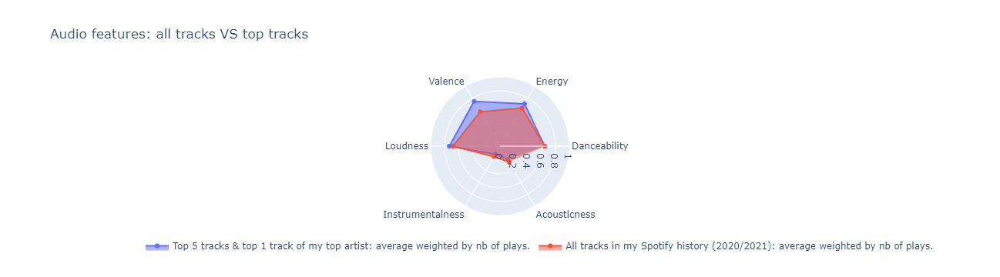

In [109]:
from plotly.subplots import make_subplots

pyo.init_notebook_mode()

categories = ['Danceability', 'Energy', 'Valence', 'Loudness','Instrumentalness', 'Acousticness']



fig = make_subplots(rows=1, cols=1, specs=[[{'type': 'polar'}]])


fig.add_trace(go.Scatterpolar(
      r= top5_top1artist_features.iloc[:, 4:10].mean(),
      theta=categories,
      fill='toself',
      name='Top 5 tracks & top 1 track of my top artist: average weighted by nb of plays.'
), 1,1)


fig.add_trace(go.Scatterpolar(
      r= spotify_features.iloc[:,4:10].mean(),
      theta=categories,
      fill='toself',
      name = 'All tracks in my Spotify history (2020/2021): average weighted by nb of plays.'
), 1,1)



fig.update_layout(
    title = "Audio features: all tracks VS top tracks\n",
    
    polar=dict(
    angularaxis_showticklabels=True,
    radialaxis_showticklabels=True,
    radialaxis=dict(
     visible=True,
      range=[0, 1])),
  showlegend=True)


fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=-0.3,
    xanchor="right",
    x=1
))


fig.write_image(r'C:\Users\Tristan\Documents\DATA\spotify_project\all_vs_tops.png')
pyo.iplot(fig, filename = 'all_vs_tops_tracks')

It seems that plotly graphs cannot be dislayed on github... I haven't found a solution. (It is possible to see the graph using https://nbviewer.jupyter.org/ but not directly on github)
So for github, I'll just upload the graph as a png:

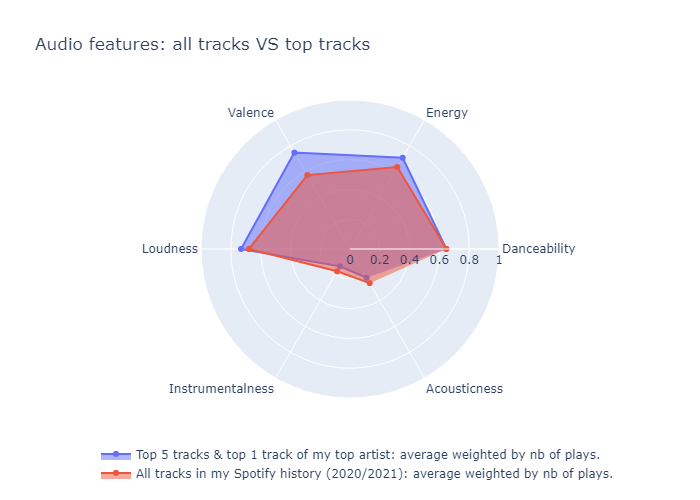

In [115]:
Image(r'C:\Users\Tristan\Documents\DATA\spotify_project\all_vs_tops.png')

Interpretation: 

   We can see that my top tracks have more valence, more energy and are a little bit louder than the rest of the tracks I listened to. The danceability is the same. And my top tracks are a bit less acoustic and instrumental.

   In other words, I'll probably like a track more if it puts me in a good mood (valence) and gives me energy. But it has to have vocals and not be acoustic.

#### Let's see the audio features of my top tracks + my top track of my top artist:

In [86]:
top5_top1artist_unique = top5_top1artist_features.drop_duplicates(subset = ['track','artist'])
top5_top1artist_unique

,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
247,2020-08-12 10:31:00,Last Train to London,Electric Light Orchestra,4.315017,0.702735,0.535569,0.972643,0.610962,0.000820,0.397989,121.493,1
1746,2020-08-30 09:30:00,Gloria,The Lumineers,3.599617,0.460166,0.715447,0.662247,0.759490,0.000005,0.661306,78.211,1
2225,2020-10-26 10:40:00,Nomalizo,Letta Mbulu,2.720633,0.840666,0.480691,0.726431,0.550627,0.002401,0.424119,98.276,1
2257,2020-10-26 10:55:00,Sledgehammer,Peter Gabriel,5.413750,0.619501,0.685976,0.414983,0.791769,0.000000,0.024721,96.458,1
2301,2020-10-26 11:02:00,Disco Inferno,The Trammps,3.564000,0.749108,0.847561,0.847433,0.845119,0.628898,0.026229,129.323,1
2518,2020-11-13 10:16:00,Nothing But A Heartache,The Flirtations,2.737333,0.419738,0.941057,0.833754,0.803370,0.000273,0.000166,111.845,1


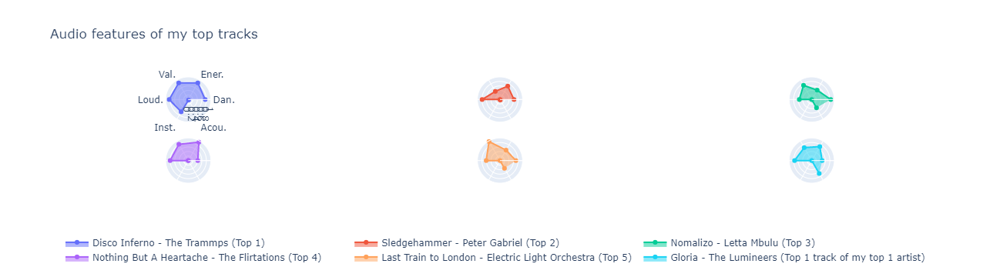

In [108]:
# Set notebook mode to work in offline
pyo.init_notebook_mode()

categories = ['Dan.', 'Ener.', 'Val.', 'Loud.','Inst.', 'Acou.']



fig = make_subplots(rows=2, cols=3, specs=[[{'type': 'polar'}]*3]*2)




fig.add_trace(go.Scatterpolar(
      r= top5_top1artist_unique.iloc[4, 4:10],
      theta=categories,
      fill='toself',
      name="Disco Inferno - The Trammps (Top 1)"
), 1,1)


fig.add_trace(go.Scatterpolar(
      r=top5_top1artist_unique.iloc[3, 4:10],
      theta=categories,
      fill='toself',
      name="Sledgehammer - Peter Gabriel (Top 2)"
), 1, 2)


fig.add_trace(go.Scatterpolar(
      r=top5_top1artist_unique.iloc[2, 4:10],
      theta=categories,
      fill='toself',
      name="Nomalizo - Letta Mbulu (Top 3)"
), 1,3)

fig.add_trace(go.Scatterpolar(
      r=top5_top1artist_unique.iloc[5, 4:10],
      theta=categories,
      fill='toself',
      name="Nothing But A Heartache - The Flirtations (Top 4)"
), 2,1)

fig.add_trace(go.Scatterpolar(
      r=top5_top1artist_unique.iloc[0, 4:10],
      theta=categories,
      fill='toself',
      name="Last Train to London - Electric Light Orchestra (Top 5)"
), 2,2)

fig.add_trace(go.Scatterpolar(
      r= top5_top1artist_unique.iloc[1, 4:10],
      theta=categories,
      fill='toself',
      name="Gloria - The Lumineers (Top 1 track of my top 1 artist)"
), 2,3)






fig.update_layout(
    title = "Audio features of my top tracks",
    
    polar=dict(
    angularaxis_showticklabels=True,
    radialaxis_showticklabels=True,
    radialaxis=dict(
     visible=True,
      range=[0, 1])),
    
    polar2=dict(
    angularaxis_showticklabels=False,
    radialaxis_showticklabels=False,
    radialaxis=dict(
     visible=True,
      range=[0, 1])),
    
    polar3=dict(
    angularaxis_showticklabels=False,
    radialaxis_showticklabels=False,
    radialaxis=dict(
     visible=True,
      range=[0, 1])),
    
    polar4=dict(
    angularaxis_showticklabels=False,
    radialaxis_showticklabels=False,
    radialaxis=dict(
     visible=True,
      range=[0, 1])),
    
    polar5=dict(
    angularaxis_showticklabels=False,
    radialaxis_showticklabels=False,
    radialaxis=dict(
     visible=True,
      range=[0, 1])),
    
    polar6=dict(
    angularaxis_showticklabels=False,
    radialaxis_showticklabels=False,
    radialaxis=dict(
     visible=True,
      range=[0, 1])),
  showlegend=True)



fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=-0.8,
    xanchor="left",
    x=0
))


fig.write_image(r'C:\Users\Tristan\Documents\DATA\spotify_project\tops_features.png')
pyo.iplot(fig, filename = 'top_tracks')


It seems that plotly graphs cannot be dislayed on github... I haven't found a solution. (It is possible to see the graph using https://nbviewer.jupyter.org/ but not directly on github) So for github, I'll just upload the graph as a png:

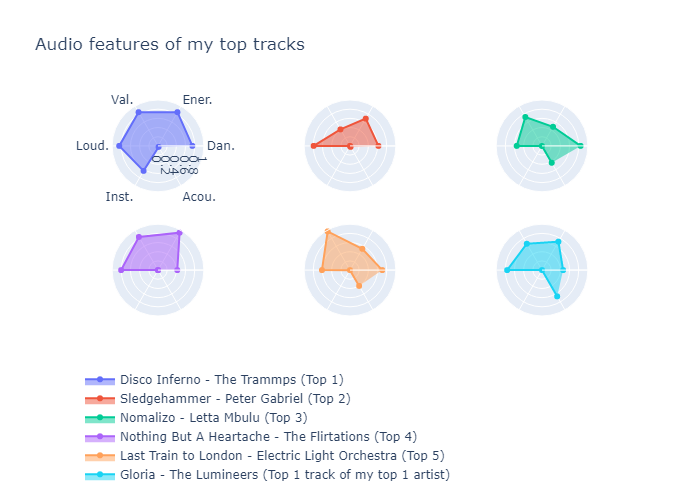

In [116]:
Image(r'C:\Users\Tristan\Documents\DATA\spotify_project\tops_features.png')

Interpretation: 

   Here again we can see that my tastes are very diverse. My top tracks do not match each other, they each have their own type of audio features. However, they all have either a good valence, a lot of energy or a good danceability score and they are all loud. Disco Inferno has moments with less vocals. Nomalizo, Last Train To London and Gloria are more acoustic.

### 4 - The audio features corresponding to the tracks I listen to in the morning, afternoon, evening and night/party: <a class="anchor" id="section_5_4"></a>

In [92]:
#Let's set datetime as index 
spotify_features.set_index('datetime', inplace = True)
spotify_features.head()

,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode
datetime,,,,,,,,,,,
2020-07-16 15:43:00,L'Orchestrina,Paolo Conte,3.314000,0.739596,0.822154,0.755892,0.653855,0.000191,0.580904,117.47,1
2020-08-15 19:14:00,L'Orchestrina,Paolo Conte,3.311583,0.739596,0.822154,0.755892,0.653855,0.000191,0.580904,117.47,1
2020-08-17 13:01:00,L'Orchestrina,Paolo Conte,3.311533,0.739596,0.822154,0.755892,0.653855,0.000191,0.580904,117.47,1
2020-08-23 15:41:00,L'Orchestrina,Paolo Conte,3.311450,0.739596,0.822154,0.755892,0.653855,0.000191,0.580904,117.47,1
2020-08-25 14:27:00,L'Orchestrina,Paolo Conte,3.314000,0.739596,0.822154,0.755892,0.653855,0.000191,0.580904,117.47,1


In [93]:
#Let's use the datetimeindex to find the hour of listening
spotify_features.reset_index(inplace= True)
spotify_features['hour'] = pd.DatetimeIndex(spotify_features["datetime"]).hour
spotify_features.head()

,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode,hour
0,2020-07-16 15:43:00,L'Orchestrina,Paolo Conte,3.314000,0.739596,0.822154,0.755892,0.653855,0.000191,0.580904,117.47,1,15
1,2020-08-15 19:14:00,L'Orchestrina,Paolo Conte,3.311583,0.739596,0.822154,0.755892,0.653855,0.000191,0.580904,117.47,1,19
2,2020-08-17 13:01:00,L'Orchestrina,Paolo Conte,3.311533,0.739596,0.822154,0.755892,0.653855,0.000191,0.580904,117.47,1,13
3,2020-08-23 15:41:00,L'Orchestrina,Paolo Conte,3.311450,0.739596,0.822154,0.755892,0.653855,0.000191,0.580904,117.47,1,15
4,2020-08-25 14:27:00,L'Orchestrina,Paolo Conte,3.314000,0.739596,0.822154,0.755892,0.653855,0.000191,0.580904,117.47,1,14


In [94]:
#Let's create a function to create the column period (values: morning/afternoon/evening/night_party)
def periodofday(x):
    if (x >= 6) and (x < 12):
        return 'morning'
    elif (x >= 12) and (x < 20 ):
        return 'afternoon'
    elif (x >= 20) or (x < 1):
        return'evening'
    elif (x >= 1) and (x < 6):
        return'night_party'

spotify_features['period'] = spotify_features['hour'].apply(periodofday)
spotify_features['period'] = pd.Categorical(spotify_features['period'], ['morning', 'afternoon', 'evening', 'night_party'])
spotify_features['period'].value_counts()

afternoon      2324
morning        1113
evening         950
night_party     251
Name: period, dtype: int64

In [95]:
#Let's create  a table for each period
morning = spotify_features.loc[spotify_features['period'] == 'morning']
afternoon = spotify_features.loc[spotify_features['period'] == 'afternoon']
evening = spotify_features.loc[spotify_features['period'] == 'evening']
night = spotify_features.loc[spotify_features['period'] == 'night_party']

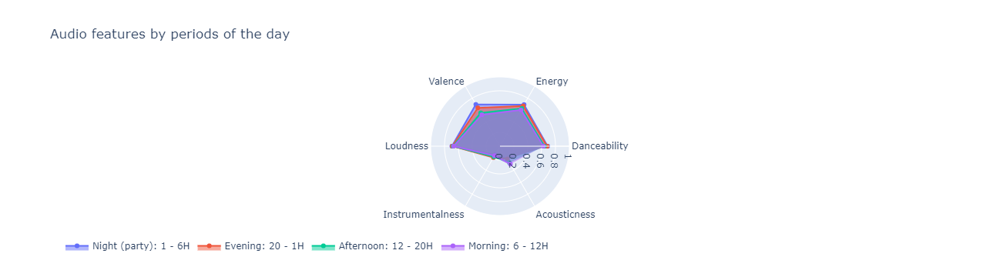

In [107]:
#Let's compare the audio features of each period

# Set notebook mode to work in offline
pyo.init_notebook_mode()

categories = ['Danceability', 'Energy', 'Valence', 'Loudness','Instrumentalness', 'Acousticness']



fig = make_subplots(rows=1, cols=1, specs=[[{'type': 'polar'}]])


fig.add_trace(go.Scatterpolar(
      r= night.iloc[:, 4:10].mean(),
      theta=categories,
      fill='toself',
      name='Night (party): 1 - 6H'
), 1,1)


fig.add_trace(go.Scatterpolar(
      r= evening.iloc[:, 4:10].mean(),
      theta=categories,
      fill='toself',
      name='Evening: 20 - 1H'
), 1,1)


fig.add_trace(go.Scatterpolar(
      r= afternoon.iloc[:, 4:10].mean(),
      theta=categories,
      fill='toself',
      name='Afternoon: 12 - 20H'
), 1,1)


fig.add_trace(go.Scatterpolar(
      r= morning.iloc[:, 4:10].mean(),
      theta=categories,
      fill='toself',
      name='Morning: 6 - 12H'
), 1,1)




fig.update_layout(
    title = "Audio features by periods of the day",
    
    polar=dict(
    angularaxis_showticklabels=True,
    radialaxis_showticklabels=True,
    radialaxis=dict(
     visible=True,
      range=[0, 1])),
  showlegend=True)


fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=-0.3,
    xanchor="left",
    x=0
))


fig.write_image(r'C:\Users\Tristan\Documents\DATA\spotify_project\audio_features_day.png')

pyo.iplot(fig, filename = 'day_tracks')


It seems that plotly graphs cannot be dislayed on github... I haven't found a solution. (It is possible to see the graph using https://nbviewer.jupyter.org/ but not directly on github) So for github, I'll just upload the graph as a png:

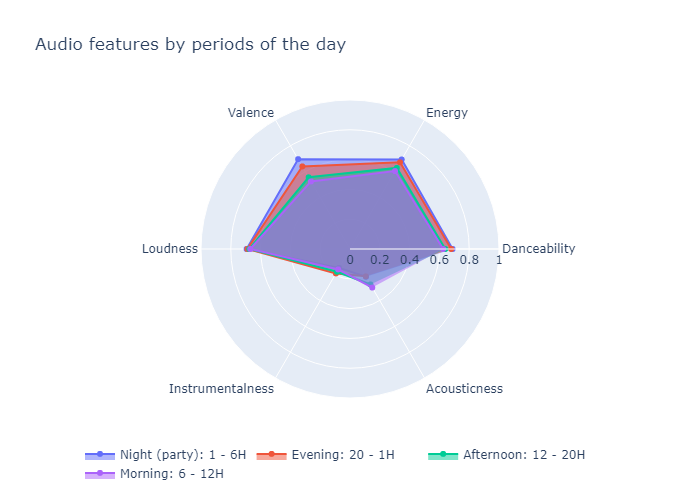

In [117]:
Image(r'C:\Users\Tristan\Documents\DATA\spotify_project\audio_features_day.png')

Interpretation: 

   It can be seen that as the day progresses, I listen to music with more valence, more energy and that are more danceable. I also seem to listen to more acoustic music in the morning (and afternoon) than in the evening and night/party.
    
    
   So if I want music for the morning, it should be a track with a high score for acousticness and a low score for other features (compared to all the tracks I have listened to).
    For the night it should be a track with a low score for acousticness and high score for the other features (compared to all the tracks I have listened to).
    For the afternoon and evening it should be between those two extremes.
    
    
   That is why I will use:
   
 - for the morning, audio features that are under the average (above for acousticness) of the morning audio features.
 - for the afternoon, audio features that are between the quartile 1 and quartile 3 of the afternoon audio features.
 - for the afternoon, audio features that are between the quartile 1 and quartile 3 of the afternoon audio features.
 - for the night/party, audio features that are above the average (under for acousticness) of the night audio features.

### 5 - Using these findings and only the audio features, let's find a track I might like to listen to in the morning/afternoon/evening/and during a party at night: <a class="anchor" id="section_5_5"></a>

In [97]:
morning_example = spotify_features.loc[(spotify_features.danceability < morning.danceability.mean() ) &
                       (spotify_features.energy < morning.energy.mean() ) &
                       (spotify_features.valence < morning.valence.mean()) &
                       (spotify_features.valence < morning.loudness.mean()) &
                       (spotify_features.instrumentalness < morning.instrumentalness.mean() )&
                       (spotify_features.acousticness > morning.acousticness.mean() )
                       ].reset_index().drop_duplicates(subset=['track','artist']).sample(n=1,random_state=3)

morning_example

,index,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode,hour,period
308,3983,2021-05-06 13:07:00,To The Sea,Jack Johnson,3.49935,0.539834,0.429878,0.510732,0.68128,0.00005,0.566833,160.393,1,13,afternoon


In [98]:
afternoon_example = spotify_features.loc[(spotify_features.danceability > afternoon.danceability.quantile(0.25) ) &
                       (spotify_features.danceability < afternoon.danceability.quantile(0.75) ) &
                       (spotify_features.energy > afternoon.energy.quantile(0.25) ) &
                       (spotify_features.energy < afternoon.energy.quantile(0.75) ) &
                       (spotify_features.valence > afternoon.valence.quantile(0.25) ) &
                       (spotify_features.valence < afternoon.valence.quantile(0.75)) &
                       (spotify_features.loudness > afternoon.loudness.quantile(0.25) )&
                       (spotify_features.loudness < afternoon.loudness.quantile(0.75) )&
                       (spotify_features.instrumentalness > afternoon.instrumentalness.quantile(0.25) )&
                       (spotify_features.instrumentalness < afternoon.instrumentalness.quantile(0.75) )&
                       (spotify_features.acousticness > afternoon.acousticness.quantile(0.25) )&
                       (spotify_features.acousticness < afternoon.acousticness.quantile(0.75) )
                       ].reset_index().drop_duplicates(subset=['track','artist']).sample(n=1,random_state=1234)

afternoon_example

,index,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode,hour,period
57,1566,2020-08-19 23:58:00,Knee Socks,Arctic Monkeys,4.292717,0.629013,0.54065,0.58649,0.668653,0.003025,0.123616,97.975,0,23,evening


In [99]:
evening_example = spotify_features.loc[(spotify_features.danceability > evening.danceability.quantile(0.25) ) &
                       (spotify_features.danceability < evening.danceability.quantile(0.75) ) &
                       (spotify_features.energy > evening.energy.quantile(0.25) ) &
                       (spotify_features.energy < evening.energy.quantile(0.75) ) &
                       (spotify_features.valence > evening.valence.quantile(0.25) ) &
                       (spotify_features.valence < evening.valence.quantile(0.75)) &
                       (spotify_features.loudness > evening.loudness.quantile(0.25) )&
                       (spotify_features.loudness < evening.loudness.quantile(0.75) )&
                       (spotify_features.instrumentalness > evening.instrumentalness.quantile(0.25) )&
                       (spotify_features.instrumentalness < evening.instrumentalness.quantile(0.75) )&
                       (spotify_features.acousticness > evening.acousticness.quantile(0.25) )&
                       (spotify_features.acousticness < evening.acousticness.quantile(0.75) )
                       ].reset_index().drop_duplicates(subset=['track','artist']).sample(n=1,random_state=98765)

evening_example

,index,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode,hour,period
44,3250,2021-03-08 16:46:00,Natural Blues,Moby,2.178883,0.64566,0.650407,0.67803,0.685266,0.052183,0.048942,107.992,0,16,afternoon


In [100]:
night_party_example =  spotify_features.loc[(spotify_features.danceability > night.danceability.mean() ) &
                       (spotify_features.energy > night.energy.mean() ) &
                       (spotify_features.valence > night.valence.mean()) &
                       (spotify_features.valence > night.loudness.mean()) &
                       (spotify_features.instrumentalness > night.instrumentalness.mean() )&
                       (spotify_features.acousticness < night.acousticness.mean() )
                       ].reset_index().drop_duplicates(subset=['track','artist']).sample(n=1,random_state=125631)
night_party_example


,index,datetime,track,artist,min_played,danceability,energy,valence,loudness,instrumentalness,acousticness,tempo,mode,hour,period
147,3091,2021-01-15 02:37:00,In Degrees - Purple Disco Machine Remix,Foals,4.0534,0.841855,0.767276,0.90846,0.771013,0.435551,0.003817,121.986,1,2,night_party


Results:

So the tracks for my day could be:

 - Morning (6 - 12H):  'To The Sea'  from  'Jack Johnson'
 - Afternoon (12 - 20H):  'Knee Socks'  from  'Arctic Monkeys'
 - Evening (20 - 1H):  'Natural Blues'  from  'Moby'
 - During a party at night (1 - 6H):  'In Degrees'  from  'Foals - Purple Disco Machine Remix'
    
Comment: Indeed, this could be what I listen to during different times of the day (and at a party in the night).

## Conclusion <a class="anchor" id="chapter6"></a>

We have seen in the exploratory data analysis (EDA) as well as in the result of the analysis that my musical tastes are very diversified. Indeed, I like to listen to quiet music like 100% piano music, louder music like rock band music, music with vocals but sometimes also music without any vocals like electro/techno music. I have a small preference for music that puts me in a good mood and gives me energy like my favourite track 'Disco Inferno', but I also like melancholic or more acoustic music like the tracks by my favourite artist 'The Lumineers'. For example, I love to listen to 'The Lumineers' when I'm working, it helps me to concentrate. 


I seem to listen to more music in the summer or during the Christmas/New Year period. During the week we saw that I listen to more music on Saturdays and less on Thursdays. Also, it was interesting to see that between Monday and Friday I listen to the most music during my launch break (around 11H, 12H, 13H, 14H) and at the weekend it's clearly Saturday afternoon after 17H that I listen to Spotify the most.


Finally, we found a pattern with my musical tastes and audio characteristics that I prefer during the day. We saw that as the day progresses, I listen to music with good valence, good energy, more danceable and less acoustic. We also conducted an interesting experiment to find a song for each period of the day that I might like to listen to, simply by selecting a song from a certain range of audio characteristics. The result is indeed relevant as the four tracks chosen could really match what I like to listen to at each time of the day.


Comment: To be even more precise and relevant, we need to have more information about the tracks such as the genre of the track. 

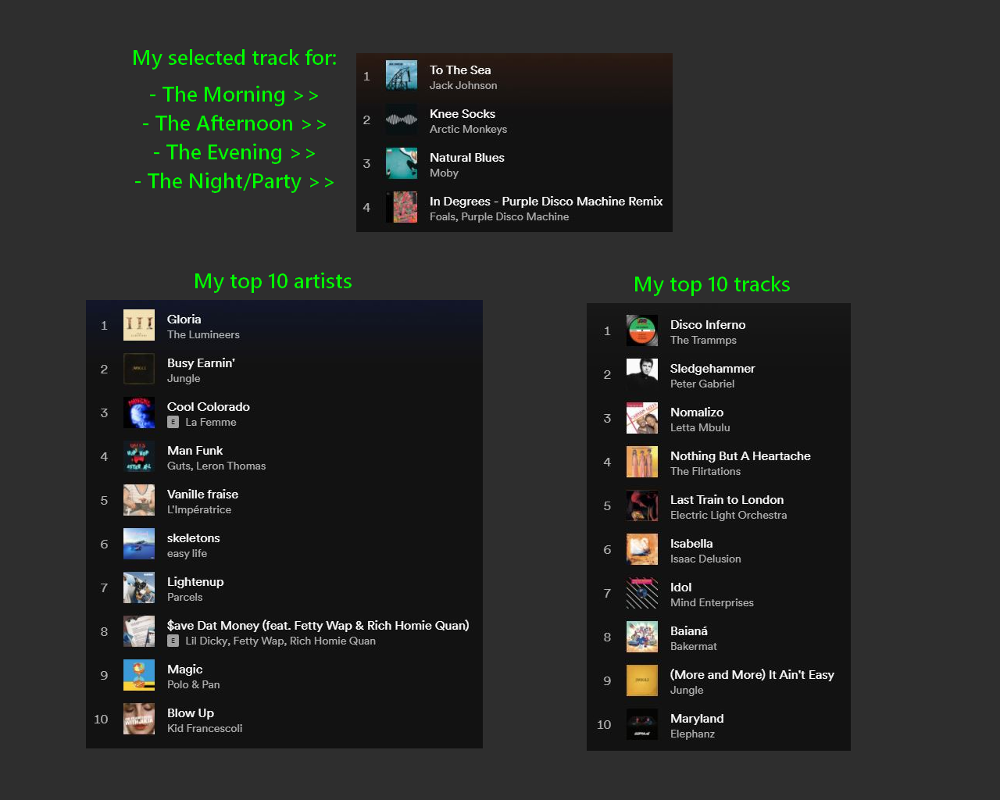

In [101]:
Image(r'C:\Users\Tristan\Documents\DATA\spotify_project\spotify_lists.png')